# Change date

In [1]:
date = '2017-04-28'
data_dir = 'data'

In [2]:
from pathlib import Path
import scipy.ndimage as ndi
import numpy as np
import matplotlib.pylab as plt
import matplotlib as mpl
%matplotlib inline
%config InlineBackend.figure_format = 'retina'
mpl.rcParams['font.sans-serif'].insert(0, 'Arial')

In [3]:
mpl.rcParams['font.size'] = 12

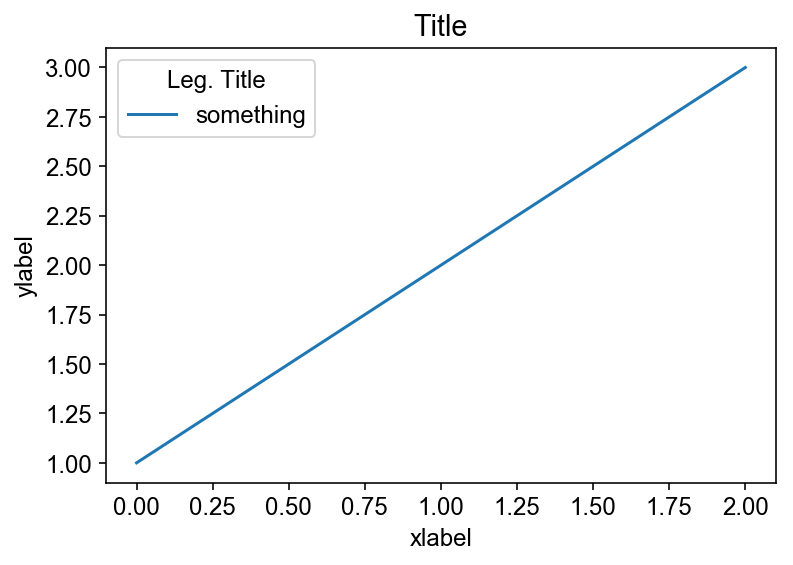

In [4]:
plt.plot([1,2,3], label='something')
plt.title('Title')
plt.xlabel('xlabel')
plt.ylabel('ylabel')
plt.legend(title='Leg. Title')

In [5]:
from skimage.transform import rotate
import scipy.optimize as so
from collections import namedtuple

In [6]:
from heatmap import heatmap48

In [7]:
dir_ = Path('.')

In [99]:
save_figures = True
savefigdir_ = 'figures'

def figure(x=None, y=None, scale=1):
    if x is None:
        x = ncols
    if y is None:
        y = nrows
    return plt.subplots(figsize=(scale*x, scale*y))

def save_name(name, folder='.', nospaces=False):
    sname = '%s/%s_%s' % (folder, mlabel, name)
    if nospaces:
        sname.replace(' ', '_')
    return sname 
    
def savefig(name, nospaces=False, **kwargs):
    if not save_figures:
        return
    kwargs_ = dict(dpi=100, bbox_inches='tight')
                   #frameon=True, facecolor='white', transparent=False)
    kwargs_.update(kwargs)
    fname = save_name(name, savefigdir_, nospaces=nospaces)
    plt.savefig(fname, **kwargs_)
    print('Saved: %s.png' % fname)

In [9]:
[f for f in Path(data_dir).glob('*.png')]

[PosixPath('data/conf10_R_11x11_647LP_200ms.png'),
 PosixPath('data/conf10_R_11x11_647LP_200ms2.png'),
 PosixPath('data/conf10_R_11x11_647LP_200ms3_darkspot.png'),
 PosixPath('data/conf10_R_11x11_647LP_200ms_reall_far_close_mirrors.png'),
 PosixPath('data/conf10_R_11x11_647LP_200ms_reall_far_close_mirrors2.png'),
 PosixPath('data/conf10_R_11x11_647LP_200ms_reall_far_close_mirrors3.png'),
 PosixPath('data/conf11_R_11x11_647LP_200ms.png'),
 PosixPath('data/conf12_R_11x11_647LP_200ms.png'),
 PosixPath('data/conf13_R_11x11_647LP_200ms.png'),
 PosixPath('data/conf14_R_11x11_647LP_200ms.png'),
 PosixPath('data/conf14_R_11x11_647LP_200ms2.png'),
 PosixPath('data/conf14_R_4x12_647LP_200ms.png'),
 PosixPath('data/conf14_R_4x12_647LP_200ms_slit.png'),
 PosixPath('data/conf1_G_4x12_647LP_200ms.png'),
 PosixPath('data/conf1_R_4x12_647LP_200ms.png'),
 PosixPath('data/conf2_G_4x12_647LP_200ms.png'),
 PosixPath('data/conf2_R_4x12_647LP_200ms.png'),
 PosixPath('data/conf3_G_11x11_647LP_200ms.png'),
 P

# Change file names

In [10]:
#crop = (300, 1200)
crop = (400, 1100)

In [11]:
fnameg = 'conf9_G_4x12_647LP_200ms_slit.png'
fnamer = 'conf14_R_4x12_647LP_200ms_slit.png'

g = ndi.imread(data_dir + '/' + fnameg)[:, crop[0]:crop[1]]
r = ndi.imread(data_dir + '/' + fnamer)[:, crop[0]:crop[1]]

In [12]:
mlabel = '_'.join([date] + fnameg.split('_')[:2] + fnamer.split('_')[:2])
mlabel

'2017-04-28_conf9_G_conf14_R'

# Change rotation

In [13]:
rotation = -0.8

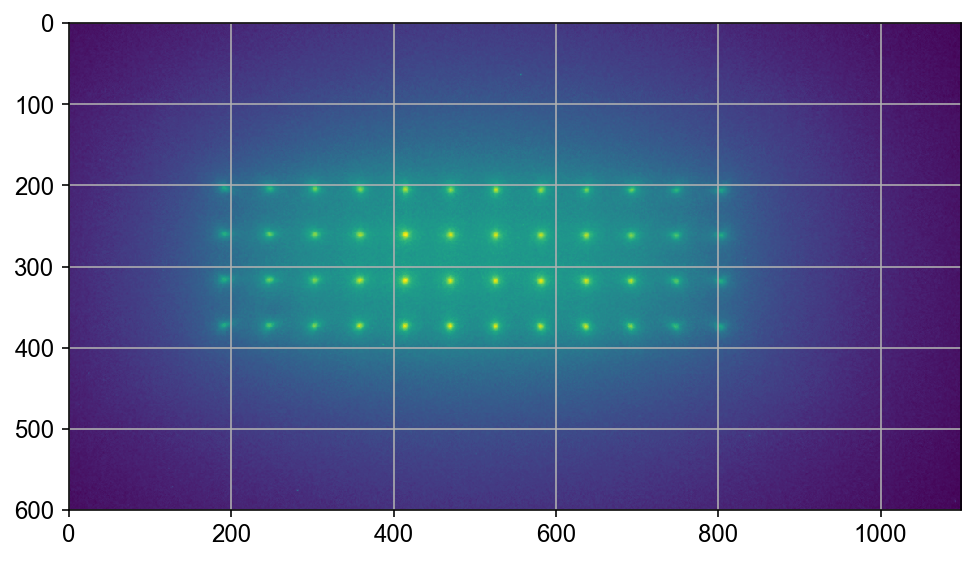

In [14]:
gr = rotate(g.T, rotation, preserve_range=True)[50:-50,50:-50]
gr -= gr.min()
plt.figure(figsize=(8, 6))
plt.imshow(gr)
plt.grid()

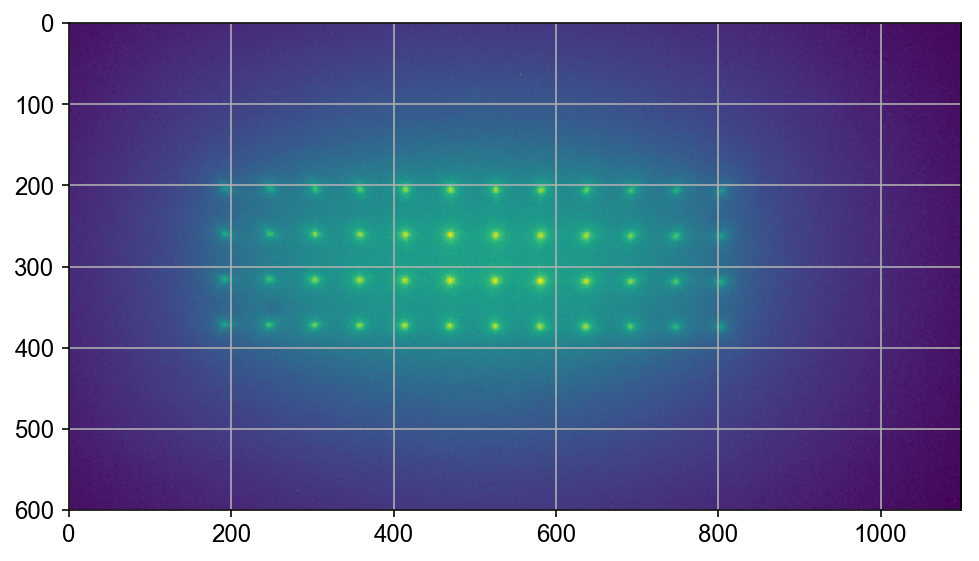

In [15]:
rr = rotate(r.T, rotation, preserve_range=True)[50:-50,50:-50]
rr -= rr.min()
plt.figure(figsize=(8, 6))
plt.imshow(rr)
plt.grid()

In [16]:
rrlp = ndi.gaussian_filter(rr, 40)
rrhp = rr - rrlp

In [17]:
grlp = ndi.gaussian_filter(gr, 40)
grhp = gr - grlp

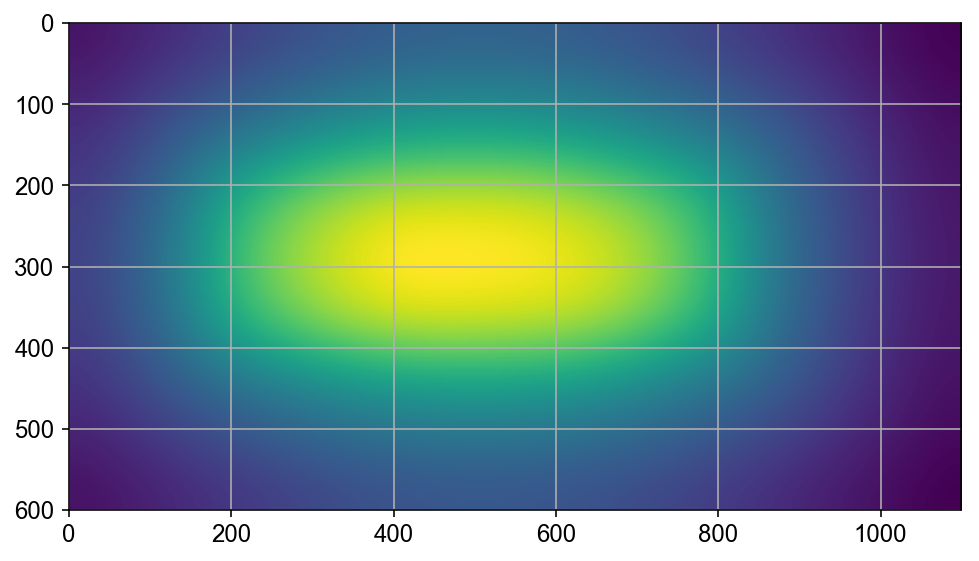

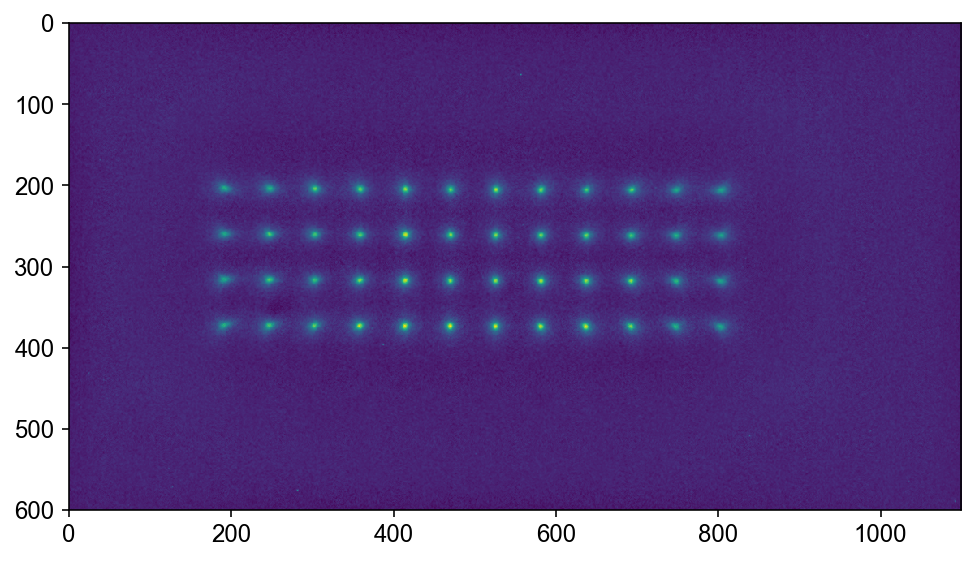

In [18]:
plt.figure(figsize=(8, 6))
plt.imshow(grlp)
plt.grid()
plt.figure(figsize=(8, 6))
plt.imshow(grhp);

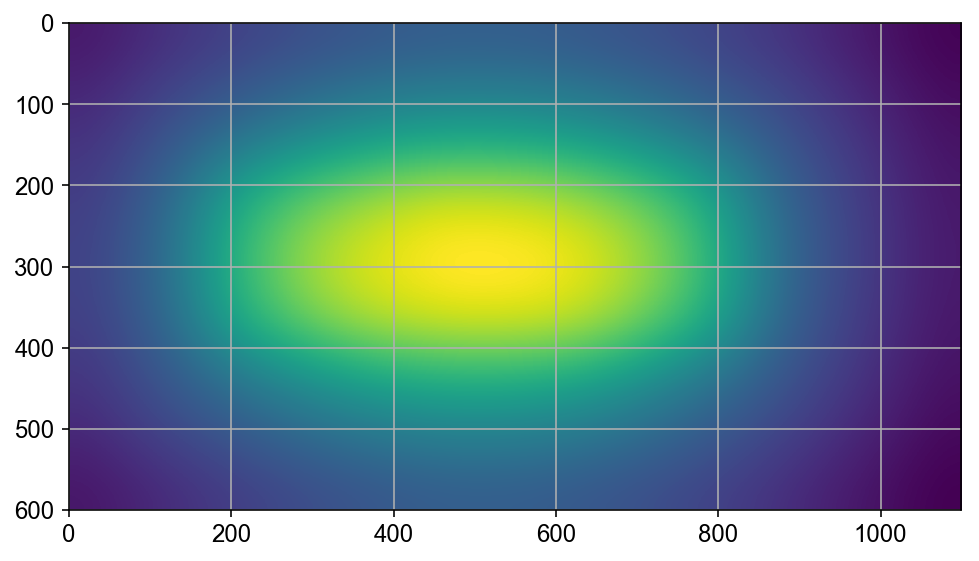

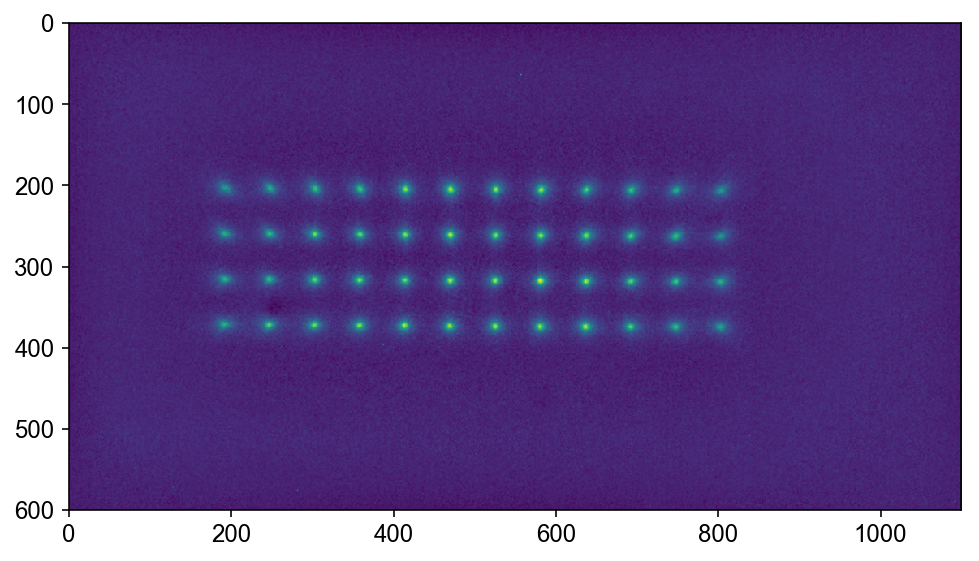

In [19]:
plt.figure(figsize=(8, 6))
plt.imshow(rrlp)
plt.grid()
plt.figure(figsize=(8, 6))
plt.imshow(rrhp);

$$f(x,y) = A \exp\left(- \left(a(x - x_o)^2 - 2b(x-x_o)(y-y_o) + c(y-y_o)^2 \right)\right)$$

$$a = \frac{\cos^2\theta}{2\sigma_x^2} + \frac{\sin^2\theta}{2\sigma_y^2}$$

$$b = -\frac{\sin2\theta}{4\sigma_x^2} + \frac{\sin2\theta}{4\sigma_y^2}$$

$$c = \frac{\sin^2\theta}{2\sigma_x^2} + \frac{\cos^2\theta}{2\sigma_y^2}$$

In [20]:
def gauss2d(x, y, mx=0, my=0, sx=1, sy=1, rot=0, A=1):
    θ = rot * np.pi / 180
    cos_sq = np.cos(θ)**2 
    sin_sq = np.sin(θ)**2
    sin_2t = np.sin(2*θ)
    dsx_sq = 2*sx**2
    dsy_sq = 2*sy**2
    a = cos_sq/dsx_sq + sin_sq/dsy_sq
    c = sin_sq/dsx_sq + cos_sq/dsy_sq
    b = - sin_2t/(2*dsx_sq) + sin_2t/(2*dsy_sq)
    xm = x - mx
    ym = y - my
    return A * np.exp(-(a*xm**2 - 2*b*xm*ym + c*ym**2))

In [21]:
def residuals(p, img):
    mx, my, sx, sy, rot = p
    X, Y = np.meshgrid(np.arange(0, img.shape[1]), np.arange(0, img.shape[0]))
    Z = gauss2d(X, Y, mx=mx, my=my, sx=sx, sy=sy, rot=rot) * img.max()
    return (Z - img).ravel()

In [22]:
Params = namedtuple('Params', 'mx my sx sy rot')

# Change xmin, ymin

In [23]:
xmin, ymin = 162, 175

In [24]:
pitch = 56
nrows = 4
ncols = 12
width = pitch * ncols
height = pitch * nrows
bounds_bbox_x = np.arange(ncols + 1)*pitch
bounds_bbox_y = np.arange(nrows + 1)*pitch
bounds_x = bounds_bbox_x + xmin
bounds_y = bounds_bbox_y + ymin
bounds_lx = bounds_bbox_x + pitch
bounds_ly = bounds_bbox_y + pitch
bbox = (slice(ymin, ymin + pitch * nrows),
        slice(xmin, xmin + pitch * ncols))
bboxl = (slice(ymin-pitch, ymin + pitch * (nrows + 1)),
         slice(xmin-pitch, xmin + pitch * (ncols + 1)))

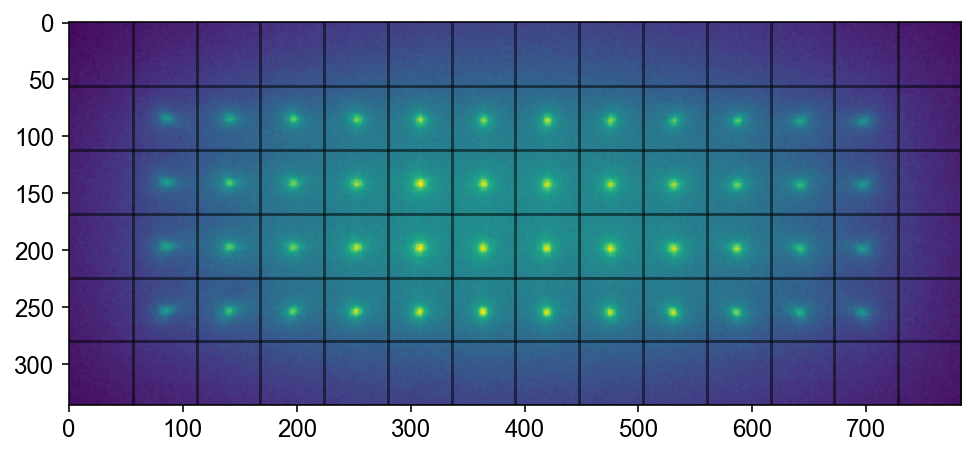

In [25]:
plt.figure(figsize=(8, 8))
plt.imshow(gr[bboxl], cmap='viridis')
for bx in bounds_lx:
    plt.axvline(bx, color='k', alpha=0.5)
for by in bounds_ly:
    plt.axhline(by, color='k', alpha=0.5)
plt.grid(False)

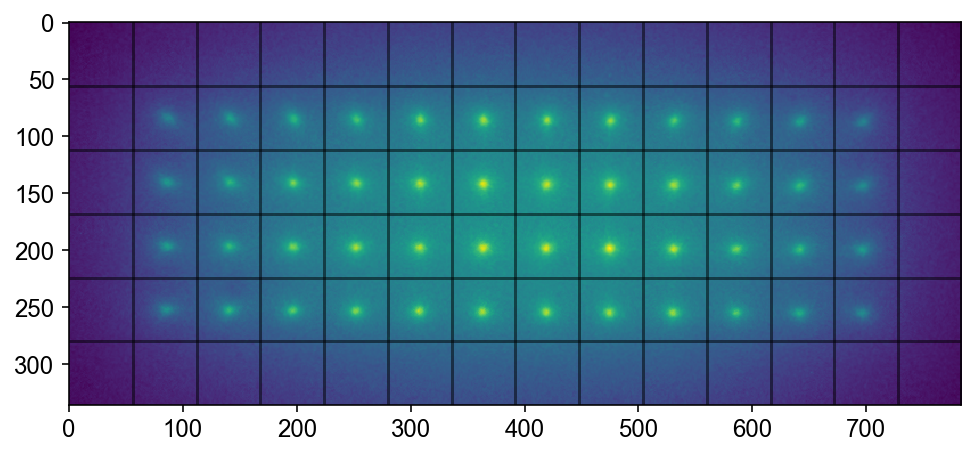

In [26]:
plt.figure(figsize=(8, 8))
plt.imshow(rr[bboxl], cmap='viridis')
for bx in bounds_lx:
    plt.axvline(bx, color='k', alpha=0.5)
for by in bounds_ly:
    plt.axhline(by, color='k', alpha=0.5)
plt.grid(False)

In [27]:
def iter_spot(img, bounds_x, bounds_y):
    for by1, by2 in zip(bounds_y[:-1], bounds_y[1:]):
        for bx1, bx2 in zip(bounds_x[:-1], bounds_x[1:]):
            yield img[by1:by2, bx1:bx2]

In [28]:
for spot in iter_spot(grhp, bounds_x, bounds_y):
    print(spot.shape, spot.max())
    break

(56, 56) 9378.15381502


In [29]:
shape = (pitch, pitch)
x, y = np.meshgrid(np.arange(0, shape[1]), np.arange(0, shape[0]))
Xm, Ym = np.meshgrid(np.arange(0, shape[1], 0.2), np.arange(0, shape[0], 0.2))

In [30]:
guess = Params(mx=pitch/2, my=pitch/2, sx=pitch/4, sy=pitch/4, rot=0)
guess

Params(mx=28.0, my=28.0, sx=14.0, sy=14.0, rot=0)

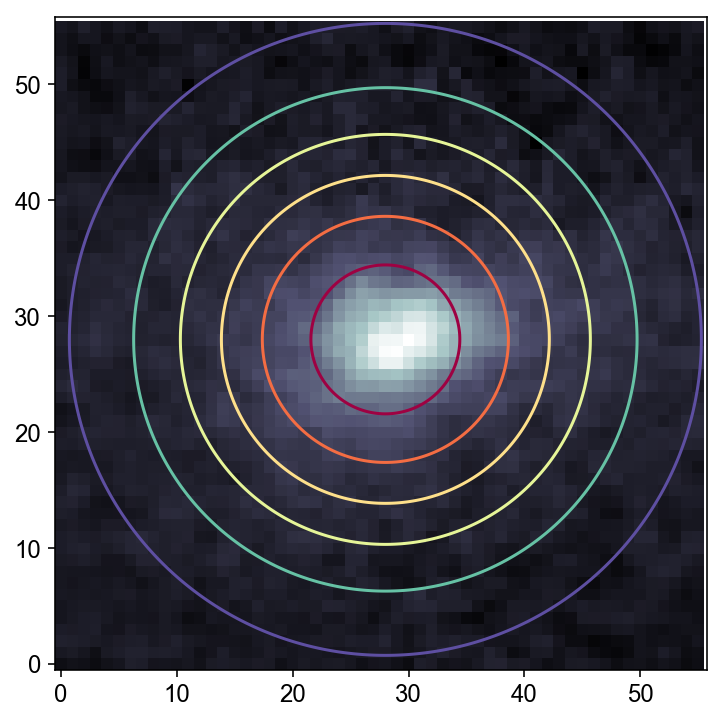

In [31]:
Z = gauss2d(Xm, Ym, *guess)

plt.figure(figsize=(6, 6))
plt.imshow(spot, interpolation='nearest', origin='lower', cmap='bone');
plt.contour(Xm, Ym, Z, 6, cmap='Spectral_r');

In [32]:
spotm = spot - spot.min()
res = so.least_squares(residuals, guess, kwargs=dict(img=spotm))
res.message, res.x, res.nfev, 

('`ftol` termination condition is satisfied.',
 array([ 29.15646389,  27.92899046,   9.29155137,   5.94622738,  10.53451164]),
 18)

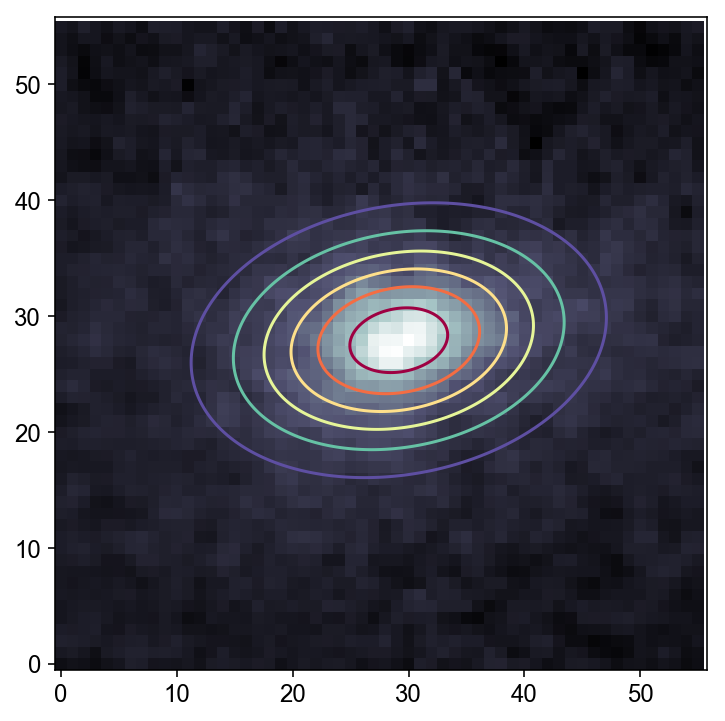

In [33]:
Z = gauss2d(Xm, Ym, *res.x)

plt.figure(figsize=(6, 6))
plt.imshow(spotm, interpolation='nearest', origin='lower', cmap='bone');
plt.contour(Xm, Ym, Z, 6, cmap='Spectral_r');
plt.grid(False)

In [34]:
ax = grhp
Res = np.zeros((nrows, ncols, 9))
Mess = []
Succ = []

for iy, (by1, by2) in enumerate(zip(bounds_y[:-1], bounds_y[1:])):
    for ix, (bx1, bx2) in enumerate(zip(bounds_x[:-1], bounds_x[1:])):
        spotm = ax[by1:by2, bx1:bx2] - ax[by1:by2, bx1:bx2].min()
        res = so.least_squares(residuals, guess, kwargs=dict(img=spotm))
        Mess.append(res.message)
        Succ.append(res.success)
        Res[iy, ix, :5] = res.x
        Res[iy, ix, 5] = ax[by1:by2, bx1:bx2].max()
        Res[iy, ix, 6] = gr[by1:by2, bx1:bx2].max()
        Res[iy, ix, 7] = ax[by1:by2, bx1:bx2].sum()
        Res[iy, ix, 8] = gr[by1:by2, bx1:bx2].sum()

In [35]:
ax = rrhp
ResR = np.zeros((nrows, ncols, 9))
MessR = []
SuccR = []

for iy, (by1, by2) in enumerate(zip(bounds_y[:-1], bounds_y[1:])):
    for ix, (bx1, bx2) in enumerate(zip(bounds_x[:-1], bounds_x[1:])):
        spotm = ax[by1:by2, bx1:bx2] - ax[by1:by2, bx1:bx2].min()
        res = so.least_squares(residuals, guess, kwargs=dict(img=spotm))
        MessR.append(res.message)
        SuccR.append(res.success)
        ResR[iy, ix, :5] = res.x
        ResR[iy, ix, 5] = ax[by1:by2, bx1:bx2].max()
        ResR[iy, ix, 6] = rr[by1:by2, bx1:bx2].max()
        ResR[iy, ix, 7] = ax[by1:by2, bx1:bx2].sum()
        ResR[iy, ix, 8] = rr[by1:by2, bx1:bx2].sum()

In [36]:
Mess[0]

'`ftol` termination condition is satisfied.'

In [37]:
MessR[0]

'`ftol` termination condition is satisfied.'

In [38]:
all(Succ), all(SuccR)

(True, True)

In [39]:
sum(Succ), sum(SuccR)

(48, 48)

In [40]:
all([Mess[0] == m for m in Mess])

True

In [41]:
all([MessR[0] == m for m in MessR])

True

In [42]:
Res.shape

(4, 12, 9)

# Fit contour plots

Saved: figures/2017-04-28_conf9_G_conf14_R_Gpattern_bone_fit.png.png


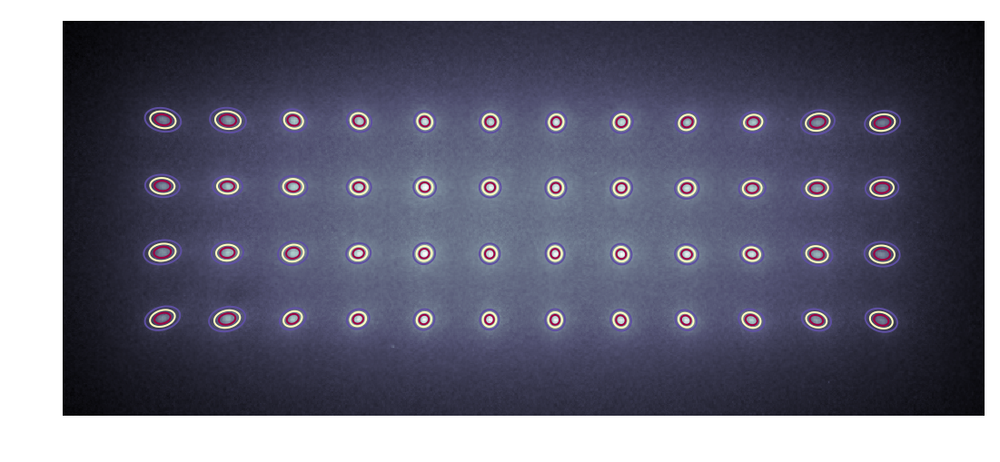

In [43]:
fig, ax = figure()
plt.imshow(gr[bboxl], cmap='bone')

for ix, bx, in enumerate(bounds_lx[:-1]):
    for iy, by, in enumerate(bounds_ly[:-1]):
        Z = gauss2d(Xm, Ym, *Res[iy, ix, :5])
        plt.contour(Xm+bx, Ym+by, Z, 3, cmap='Spectral_r', linewidths=1);
plt.grid(False)
ax.axis('off')
savefig('Gpattern_bone_fit.png')

Saved: figures/2017-04-28_conf9_G_conf14_R_Rpattern_bone_fit.png.png


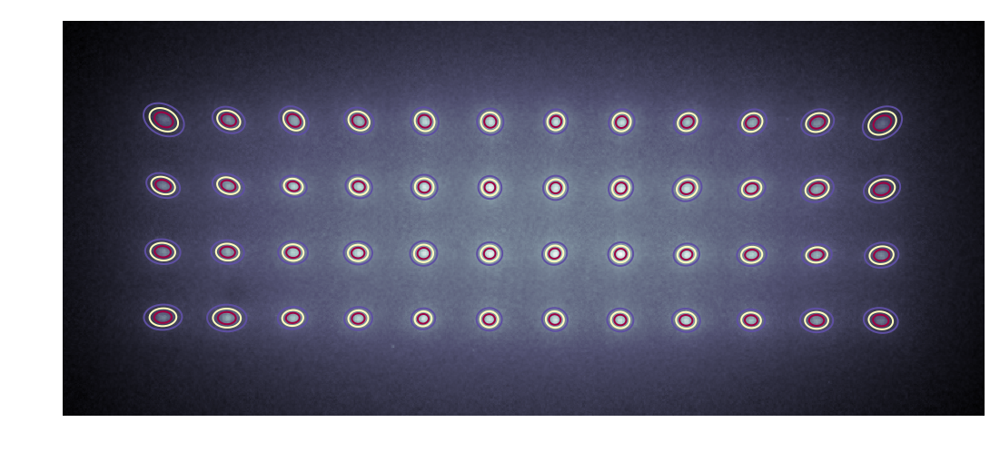

In [44]:
fig, ax = figure()
plt.imshow(rr[bboxl], cmap='bone')

for ix, bx, in enumerate(bounds_lx[:-1]):
    for iy, by, in enumerate(bounds_ly[:-1]):
        Z = gauss2d(Xm, Ym, *ResR[iy, ix, :5])
        plt.contour(Xm+bx, Ym+by, Z, 3, cmap='Spectral_r', linewidths=1);
plt.grid(False)
ax.axis('off')
savefig('Rpattern_bone_fit.png')

In [45]:
def norm_angle(angle):
    """Fold input angle in the -180.. 180 range."""
    return (np.asfarray(angle) + 180) % 360 - 180

def fold_angle(angle):
    """Fold angle in the -90..90 range."""
    nangle = norm_angle(angle)
    nangle[nangle > 90] -= 180
    nangle[nangle < -90] += 180
    return nangle

In [46]:
norm_angle(np.arange(-380, 380, 20))

array([ -20.,    0.,   20.,   40.,   60.,   80.,  100.,  120.,  140.,
        160., -180., -160., -140., -120., -100.,  -80.,  -60.,  -40.,
        -20.,    0.,   20.,   40.,   60.,   80.,  100.,  120.,  140.,
        160., -180., -160., -140., -120., -100.,  -80.,  -60.,  -40.,
        -20.,    0.])

In [47]:
norm_angle([-360, -180, 180, 360])

array([   0., -180., -180.,    0.])

In [48]:
Res1 = Res.copy()
for iy in range(Res.shape[0]):
    for ix in range(Res.shape[1]):
        if Res[iy, ix, 2] < Res[iy, ix, 3]:
            Res1[iy, ix, 2], Res1[iy, ix, 3] = Res[iy, ix, 3], Res[iy, ix, 2]
            Res1[iy, ix, 4] = Res1[iy, ix, 4] - 90
Res1[:, :, 4] = fold_angle(Res1[:, :, 4])

In [49]:
ResR1 = ResR.copy()
for iy in range(ResR.shape[0]):
    for ix in range(ResR.shape[1]):
        if ResR[iy, ix, 2] < ResR[iy, ix, 3]:
            ResR1[iy, ix, 2], ResR1[iy, ix, 3] = ResR[iy, ix, 3], ResR[iy, ix, 2]
            ResR1[iy, ix, 4] = ResR1[iy, ix, 4] - 90
ResR1[:, :, 4] = fold_angle(ResR1[:, :, 4])

Saved: figures/2017-04-28_conf9_G_conf14_R_G Rotation.png


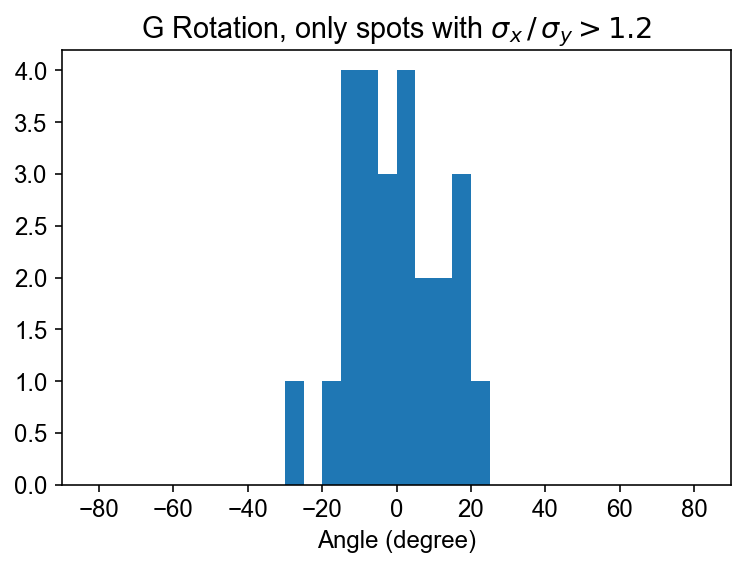

In [50]:
eccth = 1.2
ecc = Res1[:,:,2]/Res1[:,:,3]
valid = ecc >= eccth

bins = np.arange(-90, 90, 5)
plt.hist(Res1[:,:,4][valid].ravel(), bins=bins)
plt.title('G Rotation, only spots with $\sigma_x \,/\, \sigma_y > %.1f$' % eccth);
plt.xlabel('Angle (degree)')
plt.xlim(-90, 90)
savefig('G Rotation');

Saved: figures/2017-04-28_conf9_G_conf14_R_R Rotation.png


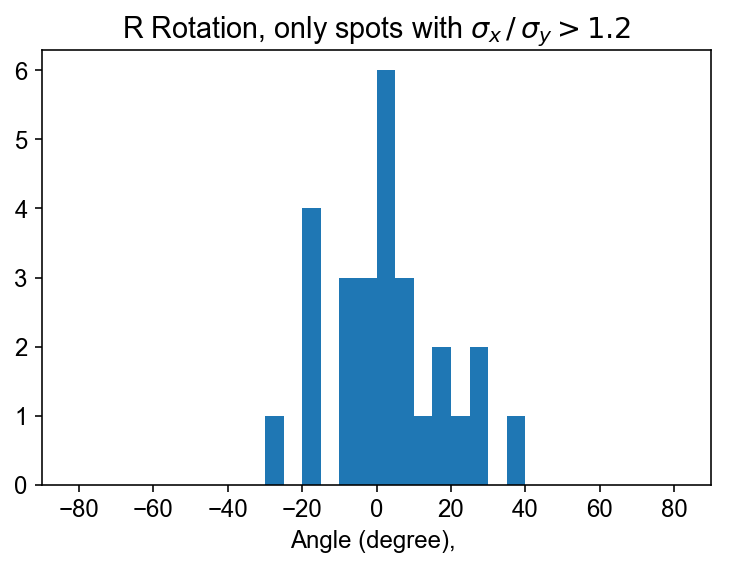

In [51]:
eccth = 1.2
eccR = ResR1[:,:,2]/ResR1[:,:,3]
valid = eccR >= eccth

bins = np.arange(-90, 90, 5)
plt.hist(ResR[:,:,4][valid].ravel(), bins=bins)
plt.xlabel('Angle (degree), ')
plt.xlim(-90, 90)
plt.title('R Rotation, only spots with $\sigma_x \,/\, \sigma_y > %.1f$' % eccth);
savefig('R Rotation');

Saved: figures/2017-04-28_conf9_G_conf14_R_G Eccentricity.png


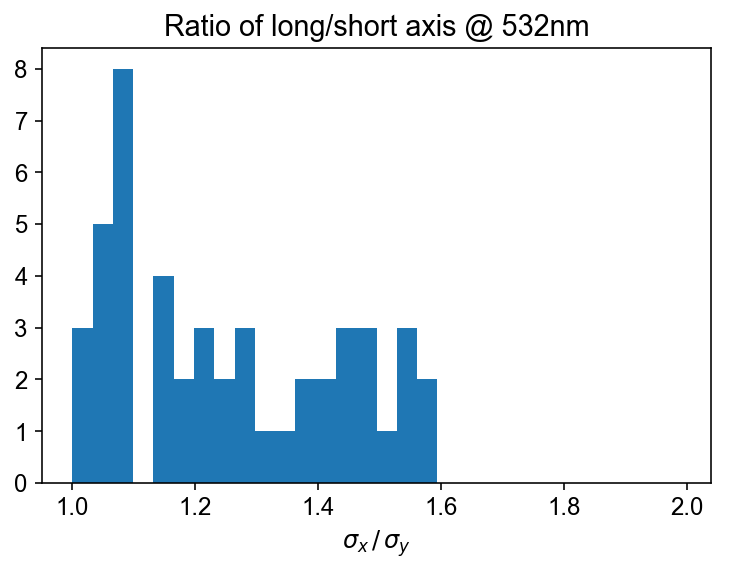

In [52]:
bins = np.arange(1, 2, 0.033)
plt.hist((Res1[:,:,2]/Res1[:,:,3]).ravel(), bins=bins)
plt.title('Ratio of long/short axis @ 532nm');
plt.xlabel('$\sigma_x \,/\, \sigma_y$', fontsize=12);
savefig('G Eccentricity');

Saved: figures/2017-04-28_conf9_G_conf14_R_R Eccentricity.png


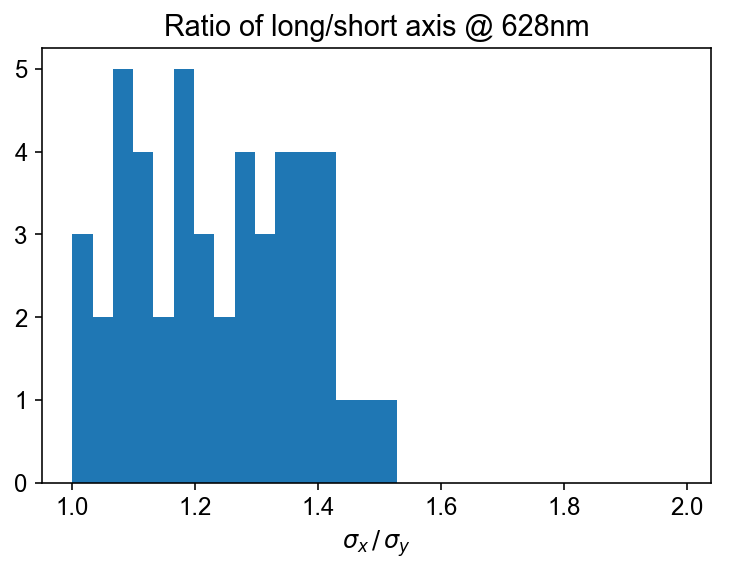

In [53]:
bins = np.arange(1, 2, 0.033)
plt.hist((ResR1[:,:,2]/ResR1[:,:,3]).ravel(), bins=bins)
plt.title('Ratio of long/short axis @ 628nm');
plt.xlabel('$\sigma_x \,/\, \sigma_y$', fontsize=12);
savefig('R Eccentricity');

Saved: figures/2017-04-28_conf9_G_conf14_R_G Sigma X.png


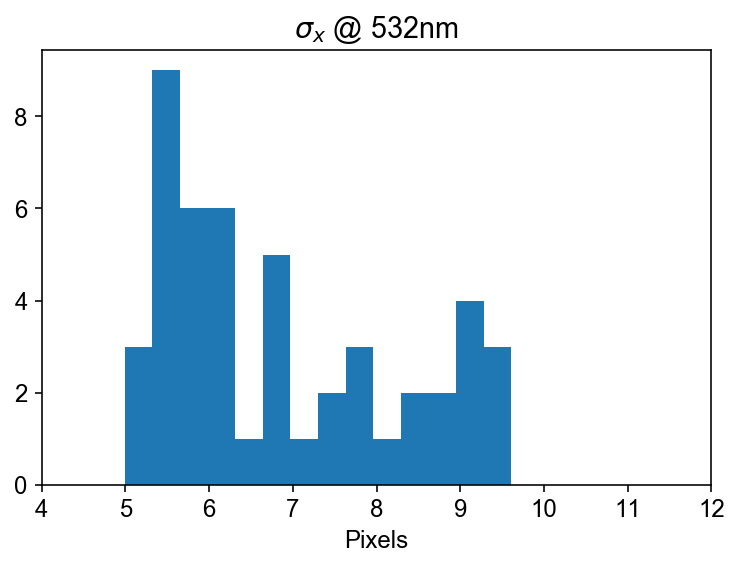

In [54]:
bins = np.arange(4, 15, 0.33)
plt.hist((Res1[:,:,2]).ravel(), bins=bins)
plt.xlim(4, 12)
plt.title('$\sigma_x$ @ 532nm');
plt.xlabel('Pixels')
savefig('G Sigma X');

Saved: figures/2017-04-28_conf9_G_conf14_R_G Sigma Y.png


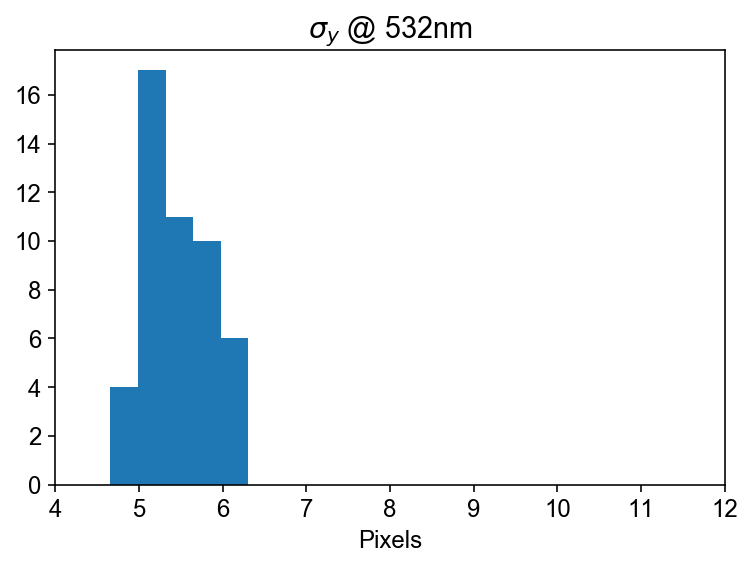

In [55]:
bins = np.arange(4, 15, 0.33)
plt.hist((Res1[:,:,3]).ravel(), bins=bins)
plt.xlim(4, 12)
plt.title('$\sigma_y$ @ 532nm');
plt.xlabel('Pixels')
savefig('G Sigma Y');

Saved: figures/2017-04-28_conf9_G_conf14_R_R Sigma X.png


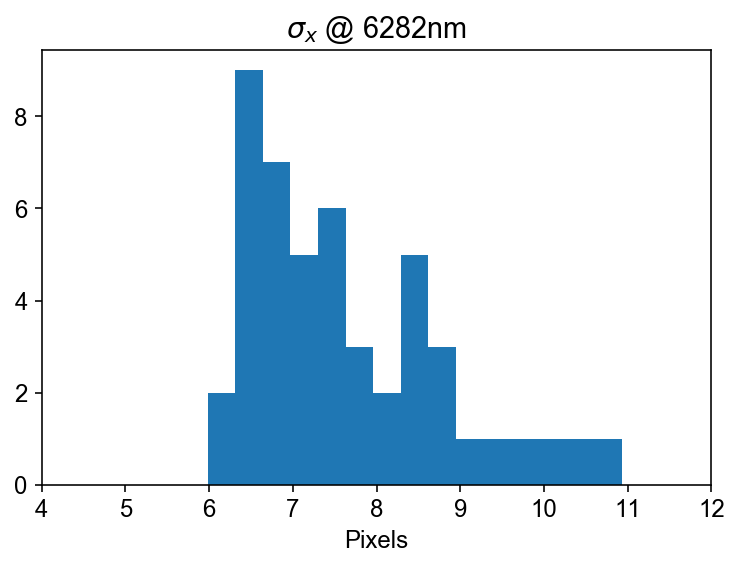

In [56]:
bins = np.arange(4, 15, 0.33)
plt.hist((ResR1[:,:,2]).ravel(), bins=bins)
plt.xlim(4, 12)
plt.title('$\sigma_x$ @ 6282nm');
plt.xlabel('Pixels')
savefig('R Sigma X');

Saved: figures/2017-04-28_conf9_G_conf14_R_R Sigma Y.png


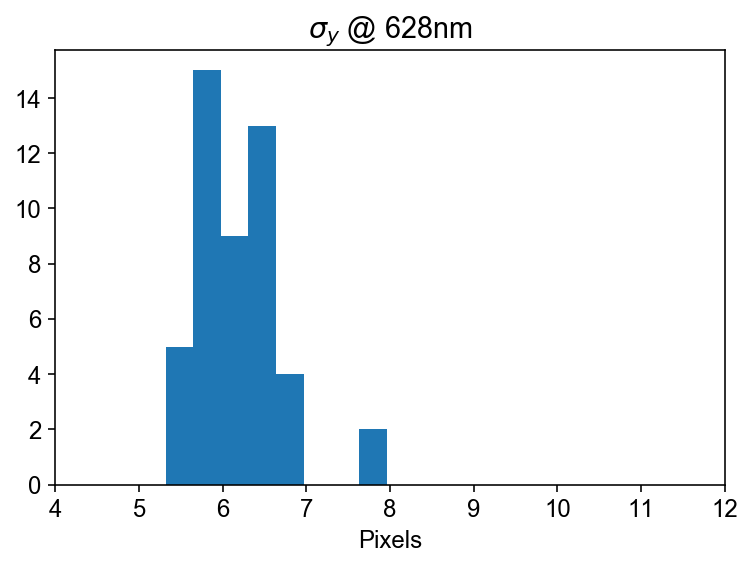

In [57]:
bins = np.arange(4, 15, 0.33)
plt.hist((ResR1[:,:,3]).ravel(), bins=bins)
plt.xlim(4, 12)
plt.title('$\sigma_y$ @ 628nm');
plt.xlabel('Pixels')
savefig('R Sigma Y');

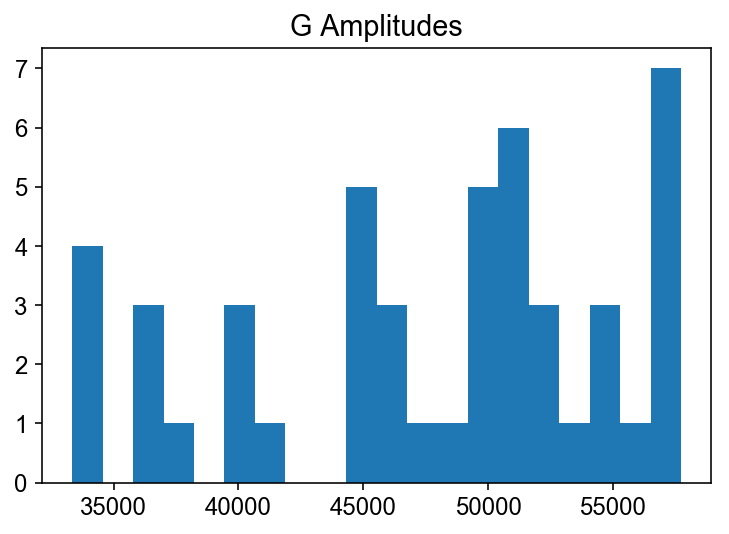

In [58]:
plt.hist(Res[:,:,-1].ravel()*1e-3, bins=20)
plt.title('G Amplitudes');

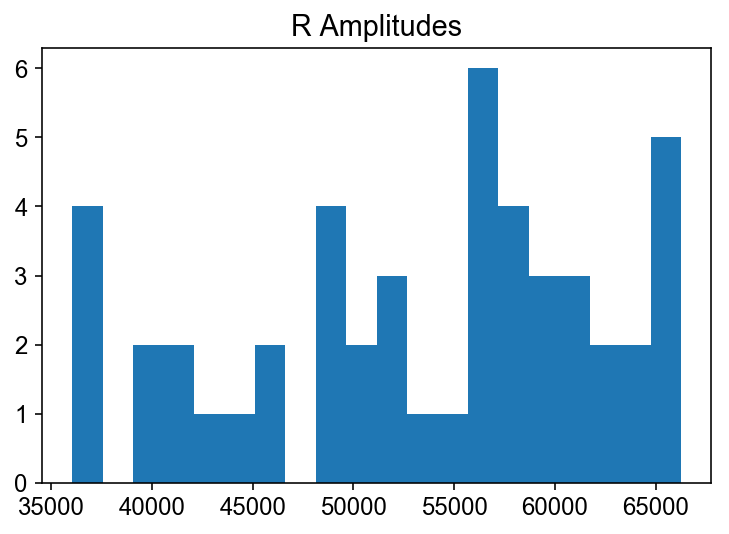

In [59]:
plt.hist(ResR[:,:,-1].ravel()*1e-3, bins=20)
plt.title('R Amplitudes');

# Heatmaps

## Intensity 

Use intensity to visualize the center of the laser beam with respect to the optical axis. 

In [60]:
ip = 8 
amplraw = Res1[:,:,ip] / Res1[:,:,ip].max()
amplrawR = ResR1[:,:,ip] / ResR1[:,:,ip].max()

In [61]:
kws = dict(nrows=nrows, ncols=ncols, annot=True, figsize=(ncols+2, nrows))

Saved: figures/2017-04-28_conf9_G_conf14_R_G amplitude raw.png


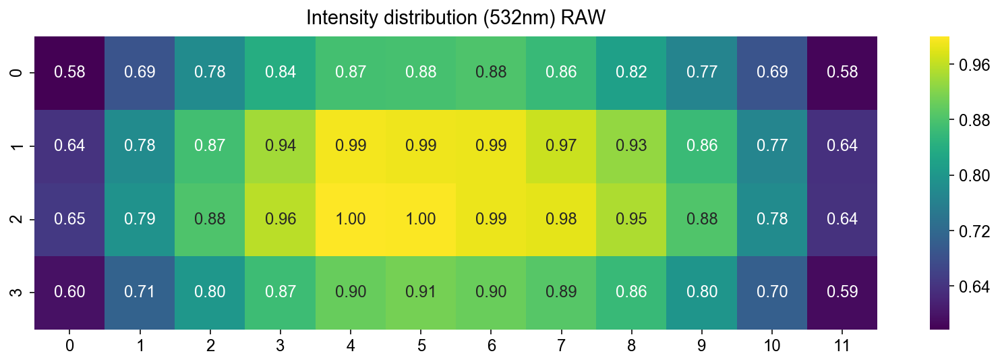

In [62]:
heatmap48(amplraw, title='Intensity distribution (532nm) RAW', fmt='3.2f', **kws)
savefig('G amplitude raw')

Saved: figures/2017-04-28_conf9_G_conf14_R_R amplitude raw.png


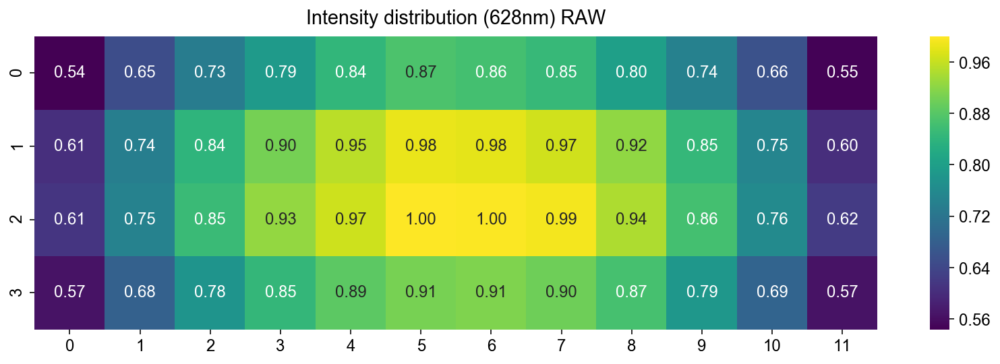

In [63]:
heatmap48(amplrawR, title='Intensity distribution (628nm) RAW', fmt='3.2f', **kws)
savefig('R amplitude raw')

In [64]:
ip = 7
ampl = Res1[:,:,ip] / Res1[:,:,ip].max()
amplR = ResR1[:,:,ip] / ResR1[:,:,ip].max()

In [65]:
# heatmap48(ampl, title='Intensity distribution (532nm) After filter', fmt='3.2f', **kws)
# savefig('G amplitude corr')

In [66]:
# heatmap48(amplR, title='Intensity distribution (628nm) After filter', fmt='3.2f', **kws)
# savefig('R amplitude corr')

## Eccentricity and rotation

Use $\sigma_x \,/\, \sigma_y$ to vizualize LCOS pattern center with respect to the optical axis.
Large rotations indicate a shift toward the optical axis, and small rotations are shifts away from the optical axis.

Saved: figures/2017-04-28_conf9_G_conf14_R_G rotation heatmap.png


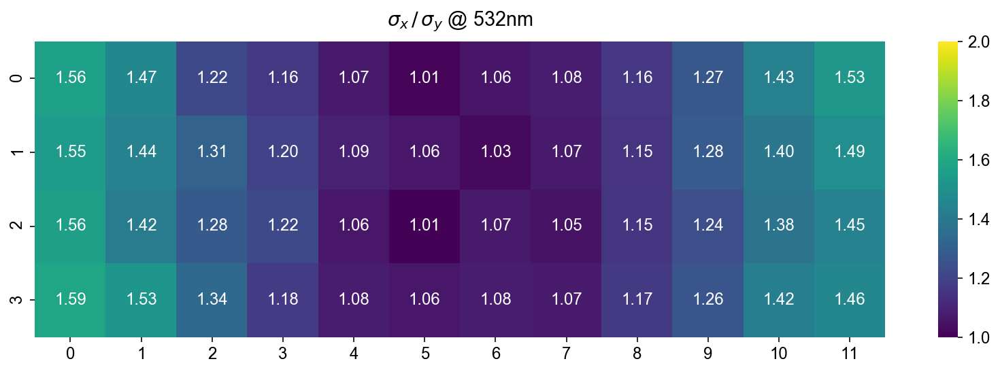

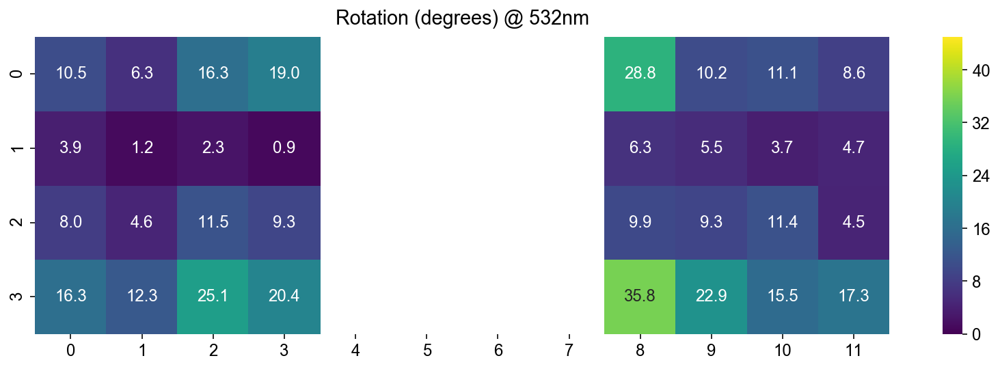

In [67]:
tilt = np.abs(Res1[:,:,4])
tilt[tilt > 45] = 90 - tilt[tilt > 45]
ecc = Res1[:,:,2]/Res1[:,:,3]
heatmap48(ecc, title='$\sigma_x \,/\, \sigma_y$ @ 532nm', vmin=1, vmax=2, fmt='3.2f', **kws)
valid = ecc >= 1.1
heatmap48(tilt, title='Rotation (degrees) @ 532nm', fmt='3.1f', mask=~valid,
          vmin=0, vmax=45, **kws)
savefig('G rotation heatmap')

Saved: figures/2017-04-28_conf9_G_conf14_R_R rotation heatmap.png


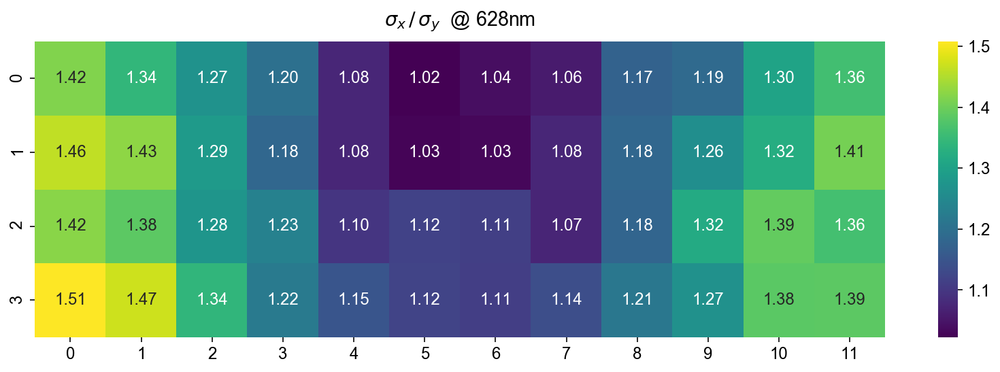

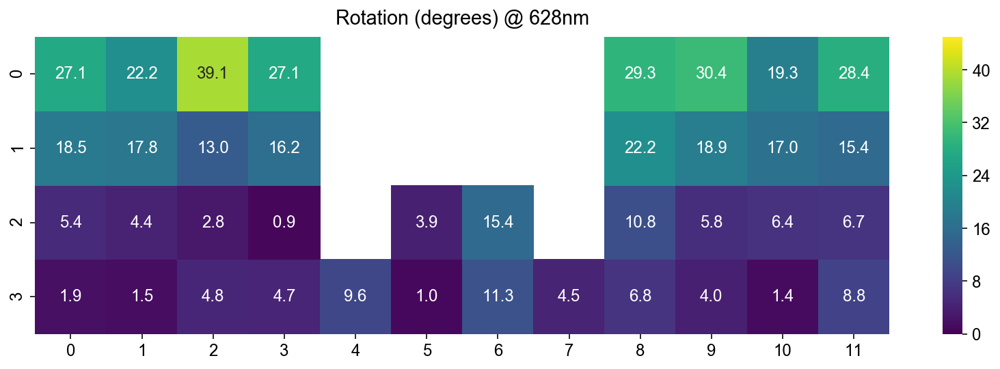

In [68]:
tilt = np.abs(ResR1[:,:,4])
tilt[tilt > 45] = 90 - tilt[tilt > 45]
eccR = ResR1[:,:,2]/ResR1[:,:,3]
heatmap48(eccR, title='$\sigma_x \,/\, \sigma_y$  @ 628nm', fmt='3.2f', **kws)
valid = eccR >= 1.1
heatmap48(tilt, title='Rotation (degrees) @ 628nm', fmt='3.1f', mask=~valid,
          vmin=0, vmax=45, **kws)
savefig('R rotation heatmap')

## Deviation in x and y

Saved: figures/2017-04-28_conf9_G_conf14_R_G sigmax heatmap.png


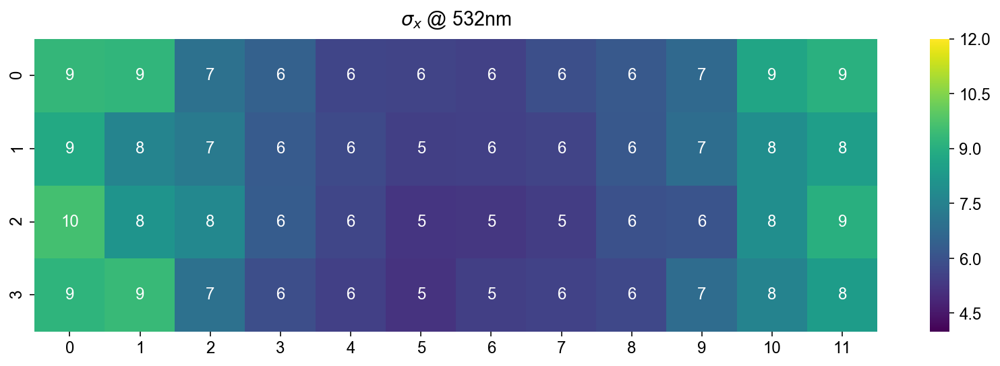

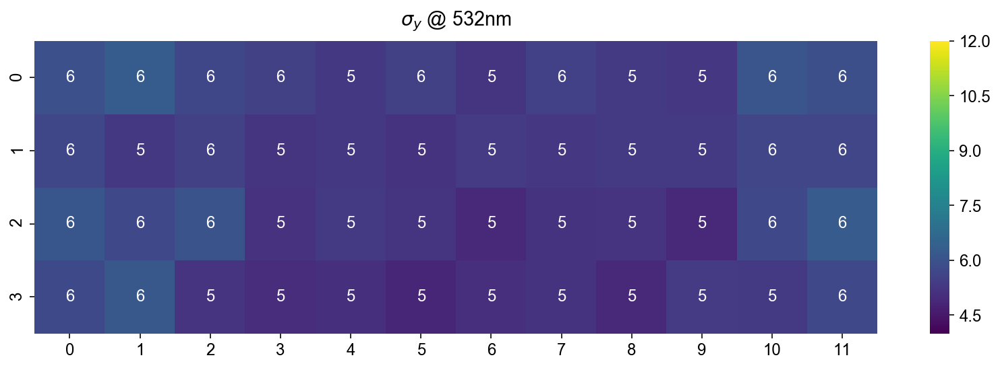

In [69]:
sigmax, sigmay = Res1[:,:,2], Res1[:,:,3]
heatmap48(sigmax, title='$\sigma_x$ @ 532nm', vmin=4, vmax=12, **kws)
savefig('G sigmax heatmap')
heatmap48(sigmay, title='$\sigma_y$ @ 532nm', vmin=4, vmax=12, **kws)

Saved: figures/2017-04-28_conf9_G_conf14_R_R sigmax heatmap.png


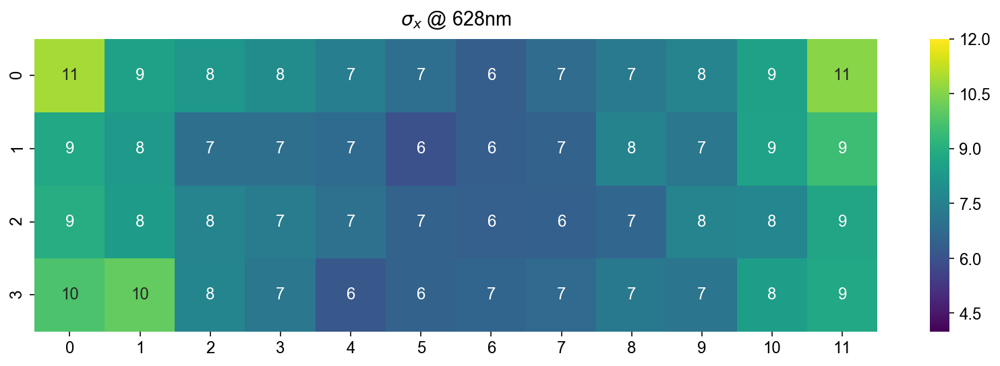

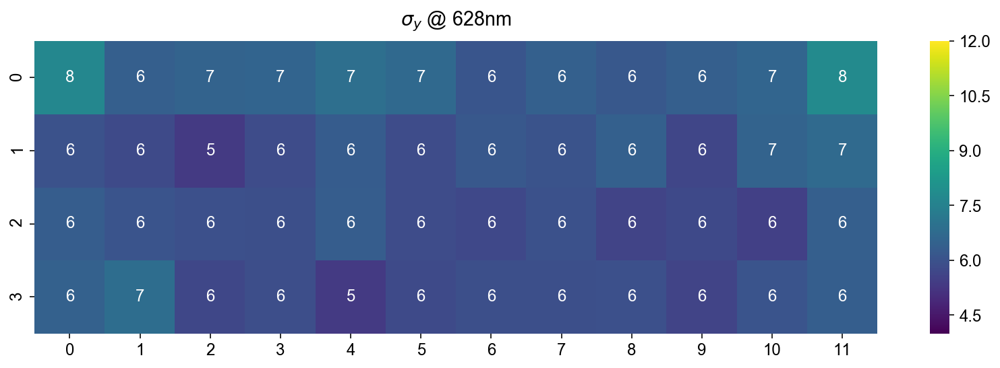

In [70]:
sigmaxR, sigmayR = ResR1[:,:,2], ResR1[:,:,3]
heatmap48(sigmaxR, title='$\sigma_x$ @ 628nm', vmin=4, vmax=12, **kws)
savefig('R sigmax heatmap')
heatmap48(sigmayR, title='$\sigma_y$ @ 628nm', vmin=4, vmax=12, **kws)

## Delta of fitted x,y centers 

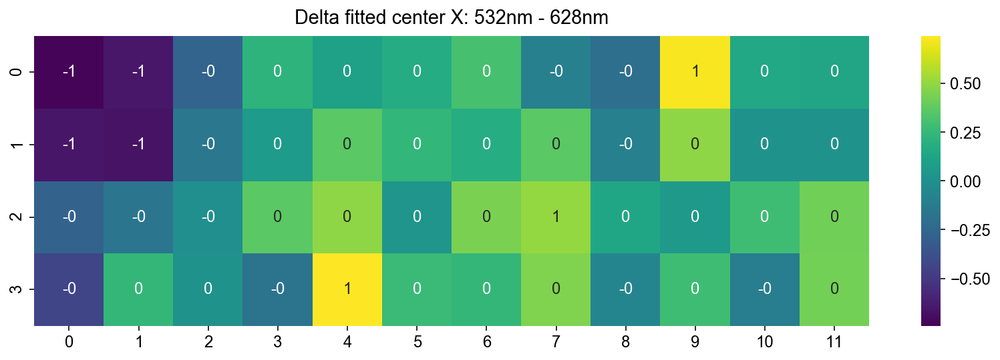

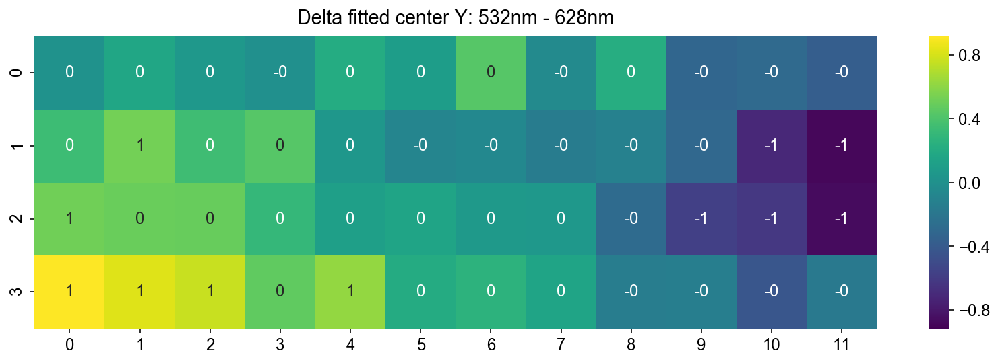

In [71]:
deltax = Res[:,:,0] - ResR[:,:,0]
deltay = Res[:,:,1] - ResR[:,:,1]
heatmap48(deltax, title='Delta fitted center X: 532nm - 628nm', **kws)
heatmap48(deltay, title='Delta fitted center Y: 532nm - 628nm', **kws)

In [72]:
posG = Res[:,:,0:2].copy()
for ix, bx, in enumerate(bounds_lx[:-1]):
    for iy, by in enumerate(bounds_ly[:-1]):
        posG[iy, ix, 0] += bx
        posG[iy, ix, 1] += by
#posG = posG.reshape(48, 2)

In [73]:
posR = ResR[:,:,0:2].copy()
for ix, bx, in enumerate(bounds_lx[:-1]):
    for iy, by in enumerate(bounds_ly[:-1]):
        posR[iy, ix, 0] += bx
        posR[iy, ix, 1] += by
#posR = posR.reshape(48, 2)

# Position and pitch

## Quiver plot

Saved: figures/2017-04-28_conf9_G_conf14_R_delta_alignment_quiver.png


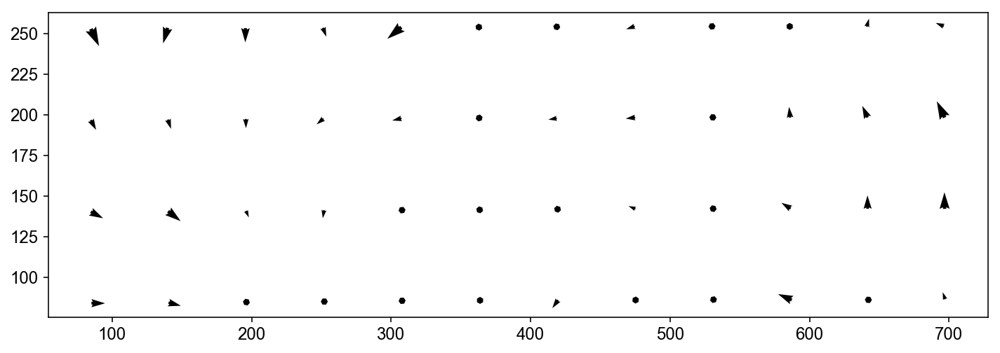

In [74]:
figure()
plt.quiver(posG[:,:,0], posG[:,:,1], posR[:,:,0]-posG[:,:,0], posR[:,:,1]-posG[:,:,1], scale=50)
savefig('delta_alignment_quiver')

## Scatter plot

Saved: figures/2017-04-28_conf9_G_conf14_R_delta_alignment_scatter.png


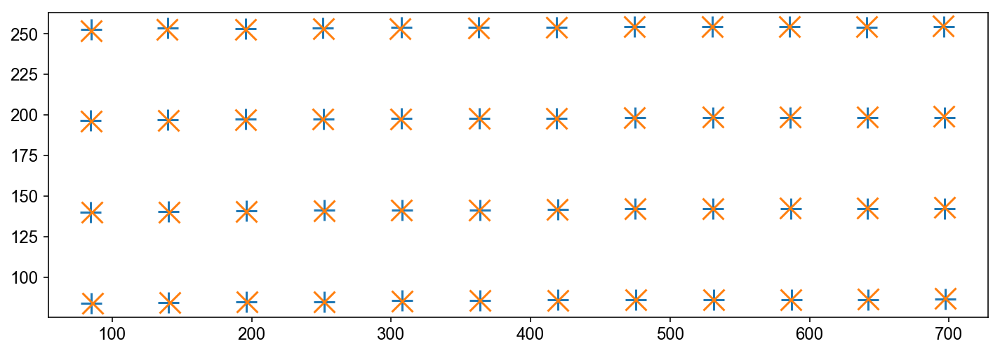

In [75]:
figure()
plt.plot(posG[:,:,0].ravel(), posG[:,:,1].ravel(), ms=15, marker='+', lw=0, mew=1.5)
plt.plot(posR[:,:,0].ravel(), posR[:,:,1].ravel(), ms=15, marker='x', lw=0, mew=1.5)
savefig('delta_alignment_scatter')

Saved: figures/2017-04-28_conf9_G_conf14_R_delta_alignment_scatter_ellipsis.png


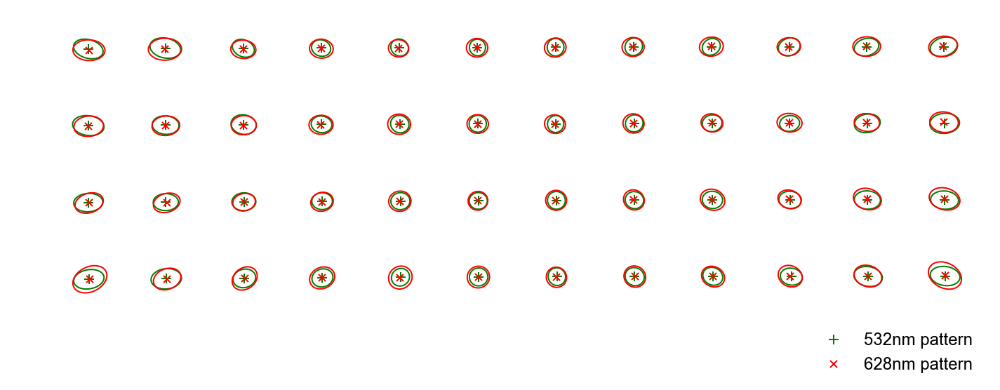

In [76]:
fig, ax = figure()
for ix, bx, in enumerate(bounds_lx[:-1]):
    for iy, by, in enumerate(bounds_ly[:-1]):
        Z = gauss2d(Xm, Ym, *Res[iy, ix, :5])
        plt.contour(Xm+bx, Ym+by, Z, 1, colors='g', alpha=1, linewidths=1);
        Z = gauss2d(Xm, Ym, *ResR[iy, ix, :5])
        plt.contour(Xm+bx, Ym+by, Z, 1, colors='r', alpha=1, linewidths=1);
plt.plot(posG[:,:,0].ravel(), posG[:,:,1].ravel(), ms=7, marker='+', color='g', lw=0, mew=1)
plt.plot(posR[:,:,0].ravel(), posR[:,:,1].ravel(), ms=5, marker='x', color='r', lw=0, mew=1)
ax.axis('off')
plt.legend(['532nm pattern', '628nm pattern'], frameon=False,
           bbox_to_anchor=(1, 0))#, borderaxespad=0)
plt.grid(False)
savefig('delta_alignment_scatter_ellipsis')

In [77]:
import matplotlib.gridspec as gridspec
from mpl_toolkits.axes_grid1.inset_locator import zoomed_inset_axes
from mpl_toolkits.axes_grid1.inset_locator import mark_inset
from matplotlib.colors import LinearSegmentedColormap

cmap = LinearSegmentedColormap.from_list('mycmap', ['black', 'white', 'black'])

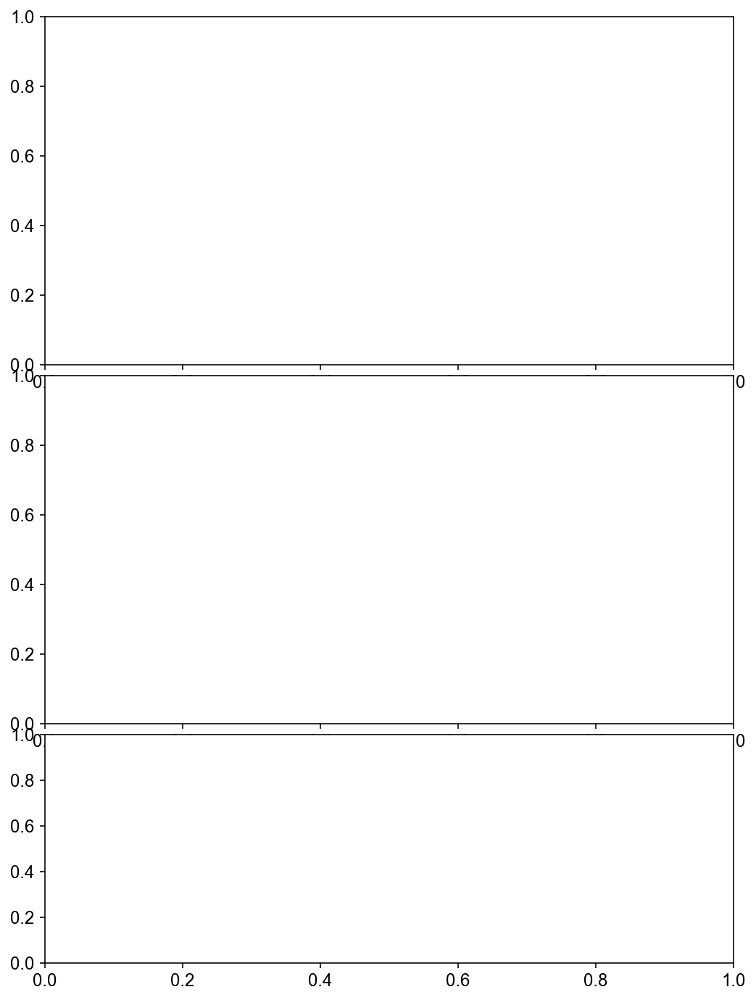

In [78]:
#fig, ax = plt.subplots(3, 1, figsize=(12, 12))
#plt.subplots_adjust(hspace=0.2, left=0.35)

fig = plt.figure(figsize=(12, 12))
ax0 = plt.subplot2grid((8, 1), (0, 0), rowspan=3)
ax1 = plt.subplot2grid((8, 1), (3, 0), rowspan=3)
ax2 = plt.subplot2grid((8, 1), (6, 0), rowspan=2)
ax = [ax0, ax1, ax2]
plt.subplots_adjust(hspace=0.1, left=0.35)

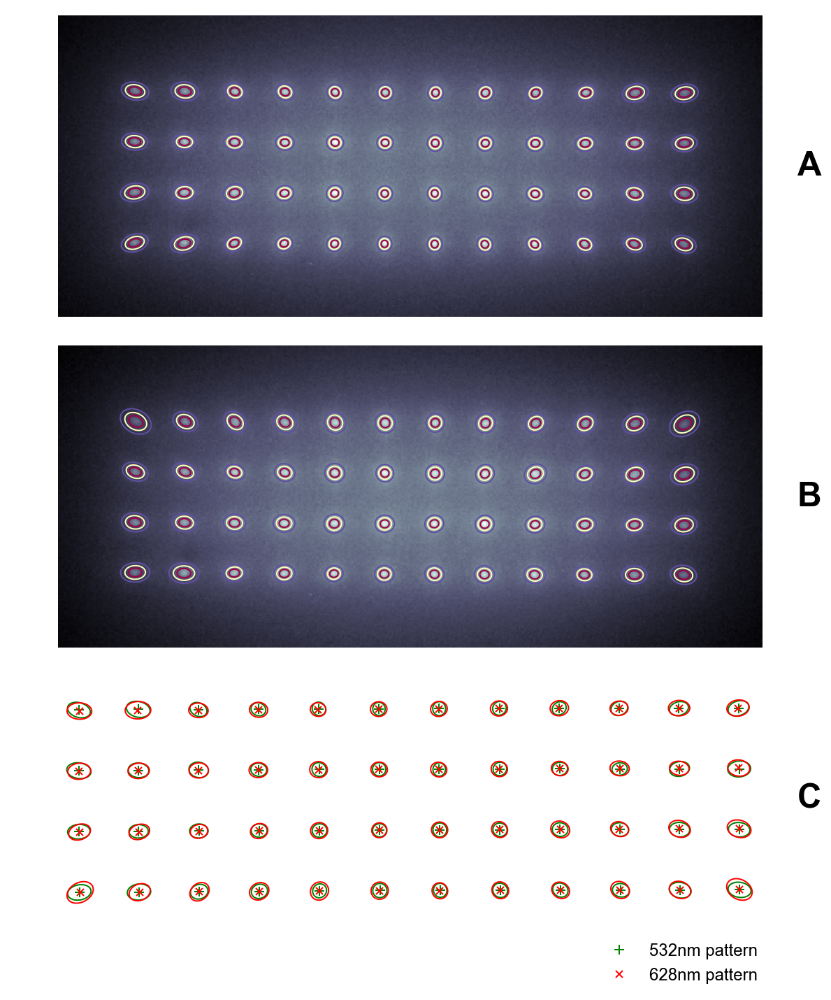

In [79]:
fig = plt.figure(figsize=(12, 12))
gs = gridspec.GridSpec(3, 1, height_ratios=[30, 30, 25])
ax0 = plt.subplot(gs[0])
ax1 = plt.subplot(gs[1])
ax2 = plt.subplot(gs[2])
ax = [ax0, ax1, ax2]
gs.update(left=0.3, hspace=0.1)

ax[0].imshow(gr[bboxl], cmap='bone')
for ix, bx, in enumerate(bounds_lx[:-1]):
    for iy, by, in enumerate(bounds_ly[:-1]):
        Z = gauss2d(Xm, Ym, *Res[iy, ix, :5])
        ax[0].contour(Xm+bx, Ym+by, Z, 3, cmap='Spectral_r', linewidths=1);

ax[1].imshow(rr[bboxl], cmap='bone')
for ix, bx, in enumerate(bounds_lx[:-1]):
    for iy, by, in enumerate(bounds_ly[:-1]):
        Z = gauss2d(Xm, Ym, *ResR[iy, ix, :5])
        ax[1].contour(Xm+bx, Ym+by, Z, 3, cmap='Spectral_r', linewidths=1);

for ix, bx, in enumerate(bounds_lx[:-1]):
    for iy, by, in enumerate(bounds_ly[:-1]):
        Z = gauss2d(Xm, Ym, *Res[iy, ix, :5])
        ax[2].contour(Xm+bx, Ym+by, Z, 1, colors='g', alpha=1, linewidths=1);
        Z = gauss2d(Xm, Ym, *ResR[iy, ix, :5])
        ax[2].contour(Xm+bx, Ym+by, Z, 1, colors='r', alpha=1, linewidths=1);
ax[2].plot(posG[:,:,0].ravel(), posG[:,:,1].ravel(), ms=7, marker='+', color='g', lw=0, mew=1)
ax[2].plot(posR[:,:,0].ravel(), posR[:,:,1].ravel(), ms=5, marker='x', color='r', lw=0, mew=1)
ax[2].set_aspect('equal', 'datalim')

for a in ax:
    a.axis('off')

ax[2].legend(['532nm pattern', '628nm pattern'], frameon=False,
             bbox_to_anchor=(1, 0));
kw = dict(va='center', fontsize=24, fontdict=dict(weight='semibold'))
ax0.text(1.05, 0.5, 'A', transform=ax0.transAxes, **kw)
ax1.text(1.05, 0.5, 'B', transform=ax1.transAxes, **kw)
ax2.text(1.05, -0.5, 'C', transform=ax1.transAxes, **kw);

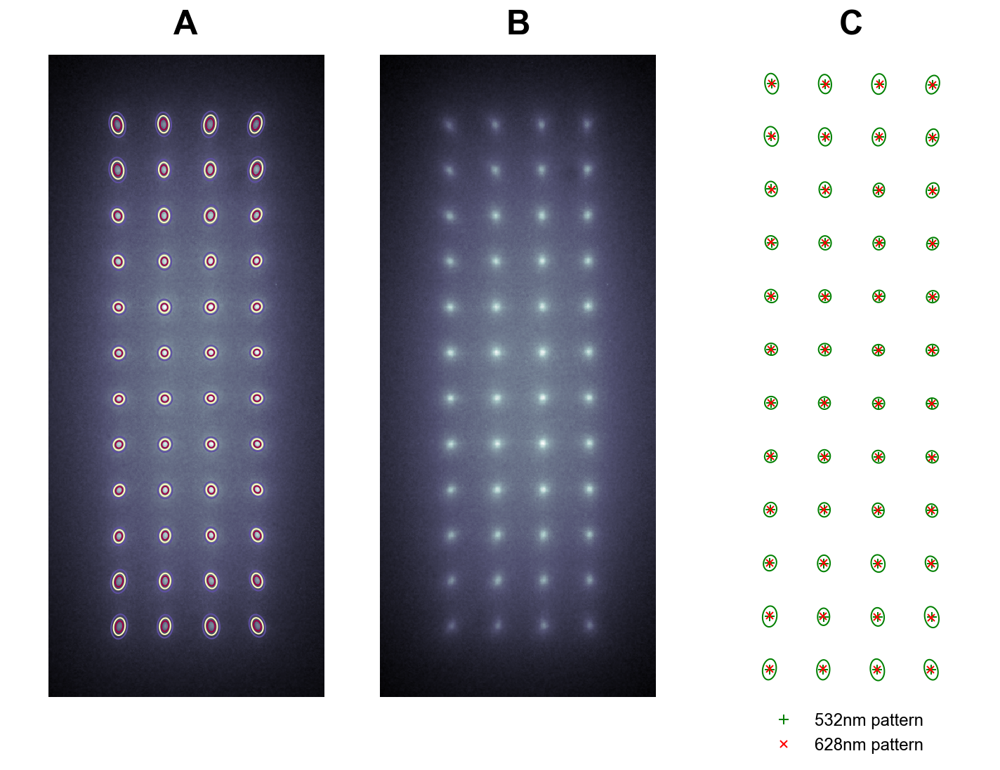

In [80]:
fig = plt.figure(figsize=(12, 12))
gs = gridspec.GridSpec(1, 3, width_ratios=[30, 30, 30])
ax0 = plt.subplot(gs[0])
ax1 = plt.subplot(gs[1])
ax2 = plt.subplot(gs[2])
ax = [ax0, ax1, ax2]
gs.update(bottom=0.35, wspace=0.2)

ax[0].imshow(gr[bboxl].T, cmap='bone')
for ix, bx, in enumerate(bounds_lx[:-1]):
    for iy, by, in enumerate(bounds_ly[:-1]):
        Z = gauss2d(Xm, Ym, *Res[iy, ix, :5])
        ax[0].contour(Ym+by, Xm+bx, Z, 3, cmap='Spectral_r', linewidths=1);

ax[1].imshow(rr[bboxl].T, cmap='bone')
# for ix, bx, in enumerate(bounds_lx[:-1]):
#     for iy, by, in enumerate(bounds_ly[:-1]):
#         Z = gauss2d(Xm, Ym, *ResR[iy, ix, :5])
#         ax[1].contour(Xm+bx, Ym+by, Z, 3, cmap='Spectral_r', linewidths=1);

for ix, bx, in enumerate(bounds_lx[:-1]):
    for iy, by, in enumerate(bounds_ly[:-1]):
        Z = gauss2d(Xm, Ym, *Res[iy, ix, :5])
        ax[2].contour(Ym+by, Xm+bx, Z, 1, colors='g', alpha=1, linewidths=1);
        #Z = gauss2d(Xm, Ym, *ResR[iy, ix, :5])
        #ax[2].contour(Xm+bx, Ym+by, Z, 1, colors='r', alpha=1, linewidths=1);
ax[2].plot(posG[:,:,1].ravel(), posG[:,:,0].ravel(), ms=7, marker='+', color='g', lw=0, mew=1)
ax[2].plot(posR[:,:,1].ravel(), posR[:,:,0].ravel(), ms=5, marker='x', color='r', lw=0, mew=1)
ax[2].set_aspect('equal', 'datalim')

for a in ax:
    a.axis('off')

ax[2].legend(['532nm pattern', '628nm pattern'], frameon=False,
             bbox_to_anchor=(0.82, 0));
kw = dict(va='top', ha='center', fontsize=24, fontdict=dict(weight='semibold'))
ax0.text(0.5, 1.07, 'A', transform=ax0.transAxes, **kw)
ax1.text(0.5, 1.07, 'B', transform=ax1.transAxes, **kw)
ax2.text(1.71, 1.07, 'C', transform=ax1.transAxes, **kw);

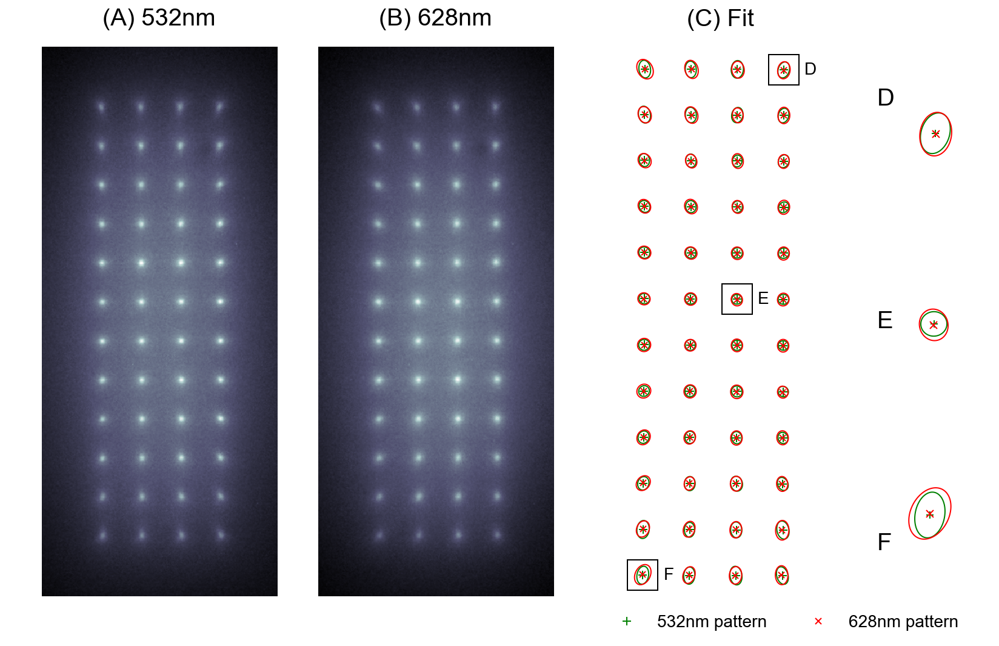

In [81]:
fig = plt.figure(figsize=(14, 12))
gs = gridspec.GridSpec(3, 4, width_ratios=[30, 30, 30, 15])
ax0 = plt.subplot(gs[:,0])
ax1 = plt.subplot(gs[:,1])
ax2 = plt.subplot(gs[:,2])
ax = [ax0, ax1, ax2]
ax3 = plt.subplot(gs[0,3])
ax4 = plt.subplot(gs[1,3])
ax5 = plt.subplot(gs[2,3])
gs.update(bottom=0.35, wspace=0.2)

ax[0].imshow(gr[bboxl].T, cmap='bone')
# for ix, bx, in enumerate(bounds_lx[:-1]):
#     for iy, by, in enumerate(bounds_ly[:-1]):
#         Z = gauss2d(Xm, Ym, *Res[iy, ix, :5])
#         ax[0].contour(Ym+by, Xm+bx, Z, 3, cmap='Spectral_r', linewidths=1);

ax[1].imshow(rr[bboxl].T, cmap='bone')
# for ix, bx, in enumerate(bounds_lx[:-1]):
#     for iy, by, in enumerate(bounds_ly[:-1]):
#         Z = gauss2d(Xm, Ym, *ResR[iy, ix, :5])
#         ax[1].contour(Xm+bx, Ym+by, Z, 3, cmap='Spectral_r', linewidths=1);

ix1, iy1 = 0, 0
ix2, iy2 = 6, 2
ix3, iy3 = 11, 3
for ix, bx, in enumerate(bounds_lx[:-1]):
    for iy, by, in enumerate(bounds_ly[:-1]):
        Zg = gauss2d(Xm, Ym, *Res[iy, ix, :5])
        ax[2].contour(Ym+by, Xm+bx, Zg, 1, colors='g', alpha=1, linewidths=1);
        Zr = gauss2d(Xm, Ym, *ResR[iy, ix, :5])
        ax[2].contour(Ym+by, Xm+bx, Zr, 1, colors='r', alpha=1, linewidths=1);
        if ix == ix1 and iy == iy1:
            ax5.contour(Ym+by, Xm+bx, Zg, 1, colors='g', alpha=1, linewidths=1);
            ax5.contour(Ym+by, Xm+bx, Zr, 1, colors='r', alpha=1, linewidths=1);
            ax5.plot(posG[iy, ix, 1].ravel(), posG[iy, ix, 0].ravel(), marker='+', color='g', mew=1)
            ax5.plot(posR[iy, ix, 1].ravel(), posR[iy, ix, 0].ravel(), marker='x', color='r', mew=1)
            ax[2].plot(posG[iy, ix, 1].ravel(), posG[iy, ix, 0].ravel(), marker='s', color='w', mew=1, mec='k', ms=25, markerfacecolor='none')
            ax2.text(posG[iy, ix, 1]+25, posG[iy, ix, 0], 'F', va='center', fontsize=14)
        if ix == ix2 and iy == iy2:
            ax4.contour(Ym+by, Xm+bx, Zg, 1, colors='g', alpha=1, linewidths=1);
            ax4.contour(Ym+by, Xm+bx, Zr, 1, colors='r', alpha=1, linewidths=1);
            ax4.plot(posG[iy, ix, 1].ravel(), posG[iy, ix, 0].ravel(), marker='+', color='g', mew=1)
            ax4.plot(posR[iy, ix, 1].ravel(), posR[iy, ix, 0].ravel(), marker='x', color='r', mew=1)
            ax[2].plot(posG[iy, ix, 1].ravel(), posG[iy, ix, 0].ravel(), marker='s', color='w', mew=1, mec='k', ms=25, markerfacecolor='none')
            ax2.text(posG[iy, ix, 1]+25, posG[iy, ix, 0], 'E', va='center', fontsize=14)
        if ix == ix3 and iy == iy3:
            ax3.contour(Ym+by, Xm+bx, Zg, 1, colors='g', alpha=1, linewidths=1);
            ax3.contour(Ym+by, Xm+bx, Zr, 1, colors='r', alpha=1, linewidths=1);
            ax3.plot(posG[iy, ix, 1].ravel(), posG[iy, ix, 0].ravel(), marker='+', color='g', mew=1)
            ax3.plot(posR[iy, ix, 1].ravel(), posR[iy, ix, 0].ravel(), marker='x', color='r', mew=1)
            ax[2].plot(posG[iy, ix, 1], posG[iy, ix, 0], marker='s', color='w', mew=1, mec='k', ms=25, markerfacecolor='none')
            ax2.text(posG[iy, ix, 1]+25, posG[iy, ix, 0], 'D', va='center', fontsize=14)
lg, = ax[2].plot(posG[:,:,1].ravel(), posG[:,:,0].ravel(), ms=7, marker='+', color='g', lw=0, mew=1)
lr, = ax[2].plot(posR[:,:,1].ravel(), posR[:,:,0].ravel(), ms=5, marker='x', color='r', lw=0, mew=1)
for a in [ax2, ax3, ax4, ax5]:
    a.set_aspect('equal', 'datalim')

for a in ax + [ax3, ax4, ax5]: a.axis('off')

ax[2].legend([lg, lr], ['532nm pattern', '628nm pattern'], frameon=False,
             bbox_to_anchor=(0, 0), loc='upper left', ncol=2, fontsize=14)
kw = dict(va='top', ha='center', fontsize=20, fontdict=dict(weight='normal'))
kw2 = dict(va='center', ha='left', fontsize=20, fontdict=dict(weight='normal'))
ax0.text(0.5, 1.07, '(A) 532nm', transform=ax0.transAxes, **kw)
ax1.text(0.5, 1.07, '(B) 628nm', transform=ax1.transAxes, **kw)
ax2.text(1.71, 1.07, '(C) Fit', transform=ax1.transAxes, **kw);
ax3.text(1.2, 0.9, 'D', transform=ax2.transAxes, **kw2);
ax4.text(1.2, 0.5, 'E', transform=ax2.transAxes, **kw2);
ax5.text(1.2, 0.1, 'F', transform=ax2.transAxes, **kw2);

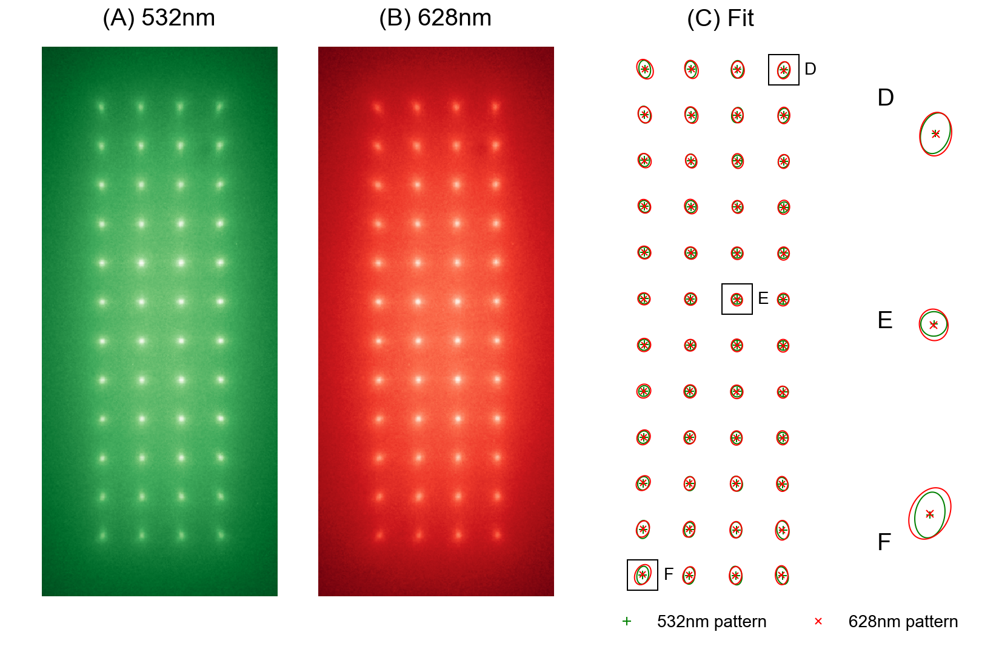

In [82]:
fig = plt.figure(figsize=(14, 12))
gs = gridspec.GridSpec(3, 4, width_ratios=[30, 30, 30, 15])
ax0 = plt.subplot(gs[:,0])
ax1 = plt.subplot(gs[:,1])
ax2 = plt.subplot(gs[:,2])
ax = [ax0, ax1, ax2]
ax3 = plt.subplot(gs[0,3])
ax4 = plt.subplot(gs[1,3])
ax5 = plt.subplot(gs[2,3])
gs.update(bottom=0.35, wspace=0.2)

ax[0].imshow(gr[bboxl].T, cmap='Greens_r')
ax[1].imshow(rr[bboxl].T, cmap='Reds_r')

ix1, iy1 = 0, 0
ix2, iy2 = 6, 2
ix3, iy3 = 11, 3
for ix, bx, in enumerate(bounds_lx[:-1]):
    for iy, by, in enumerate(bounds_ly[:-1]):
        Zg = gauss2d(Xm, Ym, *Res[iy, ix, :5])
        ax[2].contour(Ym+by, Xm+bx, Zg, 1, colors='g', alpha=1, linewidths=1);
        Zr = gauss2d(Xm, Ym, *ResR[iy, ix, :5])
        ax[2].contour(Ym+by, Xm+bx, Zr, 1, colors='r', alpha=1, linewidths=1);
        if ix == ix1 and iy == iy1:
            ax5.contour(Ym+by, Xm+bx, Zg, 1, colors='g', alpha=1, linewidths=1);
            ax5.contour(Ym+by, Xm+bx, Zr, 1, colors='r', alpha=1, linewidths=1);
            ax5.plot(posG[iy, ix, 1].ravel(), posG[iy, ix, 0].ravel(), marker='+', color='g', mew=1)
            ax5.plot(posR[iy, ix, 1].ravel(), posR[iy, ix, 0].ravel(), marker='x', color='r', mew=1)
            ax[2].plot(posG[iy, ix, 1].ravel(), posG[iy, ix, 0].ravel(), marker='s', color='w', mew=1, mec='k', ms=25, markerfacecolor='none')
            ax2.text(posG[iy, ix, 1]+25, posG[iy, ix, 0], 'F', va='center', fontsize=14)
        if ix == ix2 and iy == iy2:
            ax4.contour(Ym+by, Xm+bx, Zg, 1, colors='g', alpha=1, linewidths=1);
            ax4.contour(Ym+by, Xm+bx, Zr, 1, colors='r', alpha=1, linewidths=1);
            ax4.plot(posG[iy, ix, 1].ravel(), posG[iy, ix, 0].ravel(), marker='+', color='g', mew=1)
            ax4.plot(posR[iy, ix, 1].ravel(), posR[iy, ix, 0].ravel(), marker='x', color='r', mew=1)
            ax[2].plot(posG[iy, ix, 1].ravel(), posG[iy, ix, 0].ravel(), marker='s', color='w', mew=1, mec='k', ms=25, markerfacecolor='none')
            ax2.text(posG[iy, ix, 1]+25, posG[iy, ix, 0], 'E', va='center', fontsize=14)
        if ix == ix3 and iy == iy3:
            ax3.contour(Ym+by, Xm+bx, Zg, 1, colors='g', alpha=1, linewidths=1);
            ax3.contour(Ym+by, Xm+bx, Zr, 1, colors='r', alpha=1, linewidths=1);
            ax3.plot(posG[iy, ix, 1].ravel(), posG[iy, ix, 0].ravel(), marker='+', color='g', mew=1)
            ax3.plot(posR[iy, ix, 1].ravel(), posR[iy, ix, 0].ravel(), marker='x', color='r', mew=1)
            ax[2].plot(posG[iy, ix, 1], posG[iy, ix, 0], marker='s', color='w', mew=1, mec='k', ms=25, markerfacecolor='none')
            ax2.text(posG[iy, ix, 1]+25, posG[iy, ix, 0], 'D', va='center', fontsize=14)
lg, = ax[2].plot(posG[:,:,1].ravel(), posG[:,:,0].ravel(), ms=7, marker='+', color='g', lw=0, mew=1)
lr, = ax[2].plot(posR[:,:,1].ravel(), posR[:,:,0].ravel(), ms=5, marker='x', color='r', lw=0, mew=1)
for a in [ax2, ax3, ax4, ax5]:
    a.set_aspect('equal', 'datalim')

for a in ax + [ax3, ax4, ax5]: a.axis('off')

ax[2].legend([lg, lr], ['532nm pattern', '628nm pattern'], frameon=False,
             bbox_to_anchor=(0, 0), loc='upper left', ncol=2, fontsize=14)
kw = dict(va='top', ha='center', fontsize=20, fontdict=dict(weight='normal'))
kw2 = dict(va='center', ha='left', fontsize=20, fontdict=dict(weight='normal'))
ax0.text(0.5, 1.07, '(A) 532nm', transform=ax0.transAxes, **kw)
ax1.text(0.5, 1.07, '(B) 628nm', transform=ax1.transAxes, **kw)
ax2.text(1.71, 1.07, '(C) Fit', transform=ax1.transAxes, **kw);
ax3.text(1.2, 0.9, 'D', transform=ax2.transAxes, **kw2);
ax4.text(1.2, 0.5, 'E', transform=ax2.transAxes, **kw2);
ax5.text(1.2, 0.1, 'F', transform=ax2.transAxes, **kw2);

In [111]:
10e-6*60/5.8e-6

103.44827586206897

In [ ]:
from matplotlib.patches import Rectangle

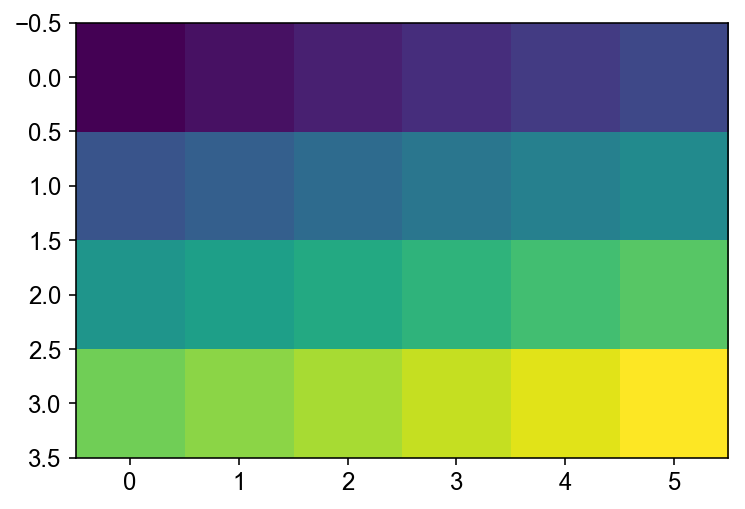

In [113]:
fig, ax = plt.subplots()
ax.imshow(np.arange(24).reshape(4, 6), interpolation='nearest')
#r = Rectangle((2, 2), 2, 1)
#ax.add_artist(r)

Saved: figures/2017-04-28_conf9_G_conf14_R_green_red_pattern_and_fit.png


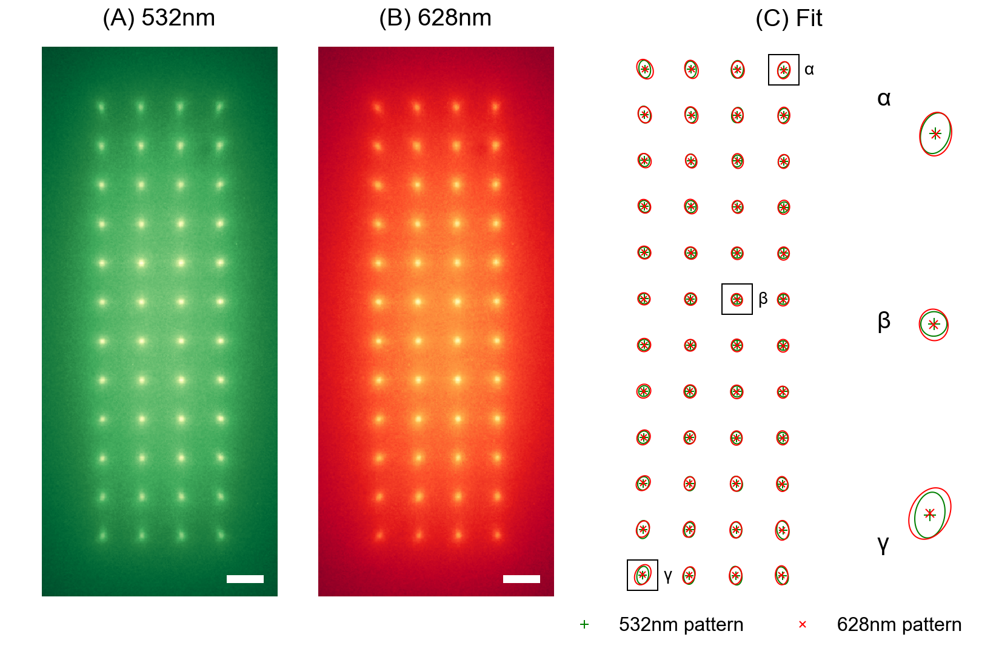

In [122]:
barlen = 5e-6                   # length of bar in meters
pixelsize = 5.86e-6 / 60        # camera's pixel-size on the sample
barlenpix = barlen / pixelsize  # bar length in pixels (data units)
barwidth = 10                   # bar thickness in pixels
barpad = 20                     # distance of bar from image corner in pixels

fig = plt.figure(figsize=(14, 12))
gs = gridspec.GridSpec(3, 4, width_ratios=[30, 30, 30, 15])
ax0 = plt.subplot(gs[:,0])
ax1 = plt.subplot(gs[:,1])
ax2 = plt.subplot(gs[:,2])
ax = [ax0, ax1, ax2]
ax3 = plt.subplot(gs[0,3])
ax4 = plt.subplot(gs[1,3])
ax5 = plt.subplot(gs[2,3])
gs.update(bottom=0.35, wspace=0.2)

ax[0].imshow(gr[bboxl].T, cmap='YlGn_r')
# for ix, bx, in enumerate(bounds_lx[:-1]):
#     for iy, by, in enumerate(bounds_ly[:-1]):
#         Z = gauss2d(Xm, Ym, *Res[iy, ix, :5])
#         ax[0].contour(Ym+by, Xm+bx, Z, 3, cmap='Spectral_r', linewidths=1);
ishape = gr[bboxl].T.shape
r = Rectangle((ishape[1] - barlenpix - barpad, ishape[0] - barwidth - barpad), barlenpix, barwidth, color='w')
ax[0].add_artist(r)

ax[1].imshow(rr[bboxl].T, cmap='YlOrRd_r')
# for ix, bx, in enumerate(bounds_lx[:-1]):
#     for iy, by, in enumerate(bounds_ly[:-1]):
#         Z = gauss2d(Xm, Ym, *ResR[iy, ix, :5])
#         ax[1].contour(Xm+bx, Ym+by, Z, 3, cmap='Spectral_r', linewidths=1);
r = Rectangle((ishape[1] - barlenpix - barpad, ishape[0] - barwidth - barpad), barlenpix, barwidth, color='w')
ax[1].add_artist(r)

ix1, iy1 = 0, 0
ix2, iy2 = 6, 2
ix3, iy3 = 11, 3
for ix, bx, in enumerate(bounds_lx[:-1]):
    for iy, by, in enumerate(bounds_ly[:-1]):
        Zg = gauss2d(Xm, Ym, *Res[iy, ix, :5])
        ax[2].contour(Ym+by, Xm+bx, Zg, 1, colors='g', alpha=1, linewidths=1);
        Zr = gauss2d(Xm, Ym, *ResR[iy, ix, :5])
        ax[2].contour(Ym+by, Xm+bx, Zr, 1, colors='r', alpha=1, linewidths=1);
        if ix == ix1 and iy == iy1:
            ax5.contour(Ym+by, Xm+bx, Zg, 1, colors='g', alpha=1, linewidths=1);
            ax5.contour(Ym+by, Xm+bx, Zr, 1, colors='r', alpha=1, linewidths=1);
            ax5.plot(posG[iy, ix, 1].ravel(), posG[iy, ix, 0].ravel(), marker='+', color='g', mew=1, ms=10)
            ax5.plot(posR[iy, ix, 1].ravel(), posR[iy, ix, 0].ravel(), marker='x', color='r', mew=1, ms=7)
            ax[2].plot(posG[iy, ix, 1].ravel(), posG[iy, ix, 0].ravel(), marker='s', color='w', mew=1, mec='k', ms=25, markerfacecolor='none')
            ax2.text(posG[iy, ix, 1]+25, posG[iy, ix, 0], 'γ', va='center', fontsize=14)
        if ix == ix2 and iy == iy2:
            ax4.contour(Ym+by, Xm+bx, Zg, 1, colors='g', alpha=1, linewidths=1);
            ax4.contour(Ym+by, Xm+bx, Zr, 1, colors='r', alpha=1, linewidths=1);
            ax4.plot(posG[iy, ix, 1].ravel(), posG[iy, ix, 0].ravel(), marker='+', color='g', mew=1, ms=10)
            ax4.plot(posR[iy, ix, 1].ravel(), posR[iy, ix, 0].ravel(), marker='x', color='r', mew=1, ms=7)
            ax[2].plot(posG[iy, ix, 1].ravel(), posG[iy, ix, 0].ravel(), marker='s', color='w', mew=1, mec='k', ms=25, markerfacecolor='none')
            ax2.text(posG[iy, ix, 1]+25, posG[iy, ix, 0], 'β', va='center', fontsize=14)
        if ix == ix3 and iy == iy3:
            ax3.contour(Ym+by, Xm+bx, Zg, 1, colors='g', alpha=1, linewidths=1);
            ax3.contour(Ym+by, Xm+bx, Zr, 1, colors='r', alpha=1, linewidths=1);
            ax3.plot(posG[iy, ix, 1].ravel(), posG[iy, ix, 0].ravel(), marker='+', color='g', mew=1, ms=10)
            ax3.plot(posR[iy, ix, 1].ravel(), posR[iy, ix, 0].ravel(), marker='x', color='r', mew=1, ms=7)
            ax[2].plot(posG[iy, ix, 1], posG[iy, ix, 0], marker='s', color='w', mew=1, mec='k', ms=25, markerfacecolor='none')
            ax2.text(posG[iy, ix, 1]+25, posG[iy, ix, 0], 'α', va='center', fontsize=14)
lg, = ax[2].plot(posG[:,:,1].ravel(), posG[:,:,0].ravel(), ms=7, marker='+', color='g', lw=0, mew=1)
lr, = ax[2].plot(posR[:,:,1].ravel(), posR[:,:,0].ravel(), ms=5, marker='x', color='r', lw=0, mew=1)
for a in [ax2, ax3, ax4, ax5]:
    a.set_aspect('equal', 'datalim')

for a in ax + [ax3, ax4, ax5]: a.axis('off')

ax[2].legend([lg, lr], ['532nm pattern', '628nm pattern'], frameon=False,
             bbox_to_anchor=(-0.20, 0), loc='upper left', ncol=2, fontsize=16)
kw = dict(va='top', ha='center', fontsize=20, fontdict=dict(weight='normal'))
kw2 = dict(va='center', ha='left', fontsize=20, fontdict=dict(weight='normal'))
ax0.text(0.5, 1.07, '(A) 532nm', transform=ax0.transAxes, **kw)
ax1.text(0.5, 1.07, '(B) 628nm', transform=ax1.transAxes, **kw)
ax2.text(2, 1.07, '(C) Fit', transform=ax1.transAxes, **kw);
ax3.text(1.2, 0.9, 'α', transform=ax2.transAxes, **kw2);
ax4.text(1.2, 0.5, 'β', transform=ax2.transAxes, **kw2);
ax5.text(1.2, 0.1, 'γ', transform=ax2.transAxes, **kw2);
savefig('green_red_pattern_and_fit')

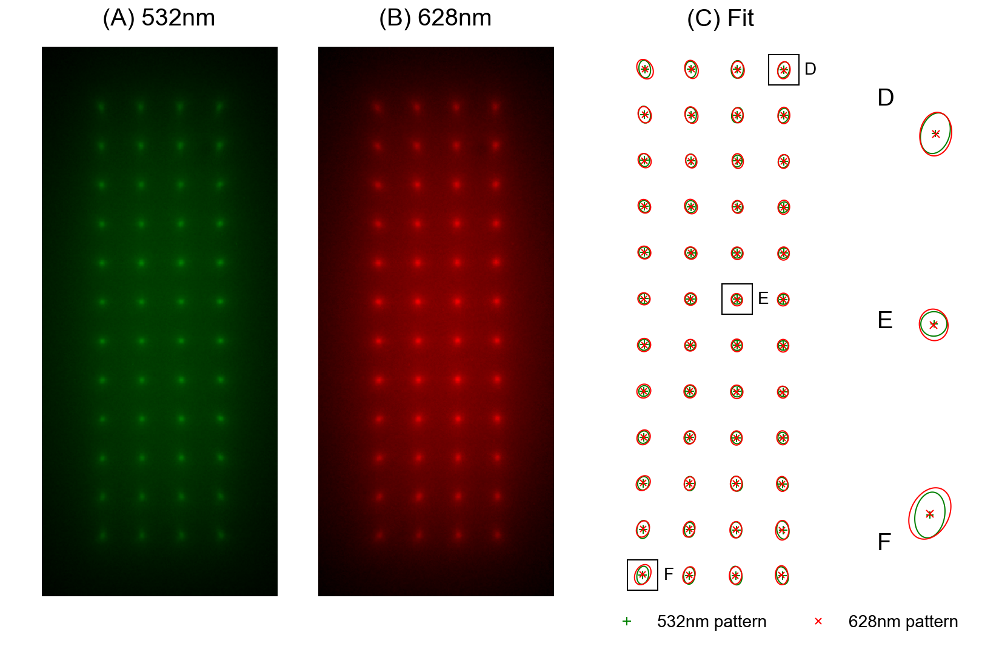

In [84]:
fig = plt.figure(figsize=(14, 12))
gs = gridspec.GridSpec(3, 4, width_ratios=[30, 30, 30, 15])
ax0 = plt.subplot(gs[:,0])
ax1 = plt.subplot(gs[:,1])
ax2 = plt.subplot(gs[:,2])
ax = [ax0, ax1, ax2]
ax3 = plt.subplot(gs[0,3])
ax4 = plt.subplot(gs[1,3])
ax5 = plt.subplot(gs[2,3])
gs.update(bottom=0.35, wspace=0.2)

cmap_r = LinearSegmentedColormap.from_list('mycmap', ['black', 'red'])
cmap_g = LinearSegmentedColormap.from_list('mycmap', ['black', 'green'])
ax[0].imshow(gr[bboxl].T, cmap=cmap_g)
ax[1].imshow(rr[bboxl].T, cmap=cmap_r)

ix1, iy1 = 0, 0
ix2, iy2 = 6, 2
ix3, iy3 = 11, 3
for ix, bx, in enumerate(bounds_lx[:-1]):
    for iy, by, in enumerate(bounds_ly[:-1]):
        Zg = gauss2d(Xm, Ym, *Res[iy, ix, :5])
        ax[2].contour(Ym+by, Xm+bx, Zg, 1, colors='g', alpha=1, linewidths=1);
        Zr = gauss2d(Xm, Ym, *ResR[iy, ix, :5])
        ax[2].contour(Ym+by, Xm+bx, Zr, 1, colors='r', alpha=1, linewidths=1);
        if ix == ix1 and iy == iy1:
            ax5.contour(Ym+by, Xm+bx, Zg, 1, colors='g', alpha=1, linewidths=1);
            ax5.contour(Ym+by, Xm+bx, Zr, 1, colors='r', alpha=1, linewidths=1);
            ax5.plot(posG[iy, ix, 1].ravel(), posG[iy, ix, 0].ravel(), marker='+', color='g', mew=1)
            ax5.plot(posR[iy, ix, 1].ravel(), posR[iy, ix, 0].ravel(), marker='x', color='r', mew=1)
            ax[2].plot(posG[iy, ix, 1].ravel(), posG[iy, ix, 0].ravel(), marker='s', color='w', mew=1, mec='k', ms=25, markerfacecolor='none')
            ax2.text(posG[iy, ix, 1]+25, posG[iy, ix, 0], 'F', va='center', fontsize=14)
        if ix == ix2 and iy == iy2:
            ax4.contour(Ym+by, Xm+bx, Zg, 1, colors='g', alpha=1, linewidths=1);
            ax4.contour(Ym+by, Xm+bx, Zr, 1, colors='r', alpha=1, linewidths=1);
            ax4.plot(posG[iy, ix, 1].ravel(), posG[iy, ix, 0].ravel(), marker='+', color='g', mew=1)
            ax4.plot(posR[iy, ix, 1].ravel(), posR[iy, ix, 0].ravel(), marker='x', color='r', mew=1)
            ax[2].plot(posG[iy, ix, 1].ravel(), posG[iy, ix, 0].ravel(), marker='s', color='w', mew=1, mec='k', ms=25, markerfacecolor='none')
            ax2.text(posG[iy, ix, 1]+25, posG[iy, ix, 0], 'E', va='center', fontsize=14)
        if ix == ix3 and iy == iy3:
            ax3.contour(Ym+by, Xm+bx, Zg, 1, colors='g', alpha=1, linewidths=1);
            ax3.contour(Ym+by, Xm+bx, Zr, 1, colors='r', alpha=1, linewidths=1);
            ax3.plot(posG[iy, ix, 1].ravel(), posG[iy, ix, 0].ravel(), marker='+', color='g', mew=1)
            ax3.plot(posR[iy, ix, 1].ravel(), posR[iy, ix, 0].ravel(), marker='x', color='r', mew=1)
            ax[2].plot(posG[iy, ix, 1], posG[iy, ix, 0], marker='s', color='w', mew=1, mec='k', ms=25, markerfacecolor='none')
            ax2.text(posG[iy, ix, 1]+25, posG[iy, ix, 0], 'D', va='center', fontsize=14)
lg, = ax[2].plot(posG[:,:,1].ravel(), posG[:,:,0].ravel(), ms=7, marker='+', color='g', lw=0, mew=1)
lr, = ax[2].plot(posR[:,:,1].ravel(), posR[:,:,0].ravel(), ms=5, marker='x', color='r', lw=0, mew=1)
for a in [ax2, ax3, ax4, ax5]:
    a.set_aspect('equal', 'datalim')

for a in ax + [ax3, ax4, ax5]: a.axis('off')

ax[2].legend([lg, lr], ['532nm pattern', '628nm pattern'], frameon=False,
             bbox_to_anchor=(0, 0), loc='upper left', ncol=2, fontsize=14)
kw = dict(va='top', ha='center', fontsize=20, fontdict=dict(weight='normal'))
kw2 = dict(va='center', ha='left', fontsize=20, fontdict=dict(weight='normal'))
ax0.text(0.5, 1.07, '(A) 532nm', transform=ax0.transAxes, **kw)
ax1.text(0.5, 1.07, '(B) 628nm', transform=ax1.transAxes, **kw)
ax2.text(1.71, 1.07, '(C) Fit', transform=ax1.transAxes, **kw);
ax3.text(1.2, 0.9, 'D', transform=ax2.transAxes, **kw2);
ax4.text(1.2, 0.5, 'E', transform=ax2.transAxes, **kw2);
ax5.text(1.2, 0.1, 'F', transform=ax2.transAxes, **kw2);

In [85]:
G_mean_pos = posG.mean(axis=0).mean(axis=0)
R_mean_pos = posR.mean(axis=0).mean(axis=0)
G_mean_pos, R_mean_pos

(array([ 391.09976733,  169.6649338 ]), array([ 391.01439186,  169.6070895 ]))

In [86]:
G_mean_pitch_x = np.diff(posG[:, :, 0], axis=1).mean()
G_mean_pitch_y = np.diff(posG[:, :, 1], axis=0).mean()
R_mean_pitch_x = np.diff(posR[:, :, 0], axis=1).mean()
R_mean_pitch_y = np.diff(posR[:, :, 1], axis=0).mean()

(G_mean_pitch_x, G_mean_pitch_y), (R_mean_pitch_x, R_mean_pitch_y)

((55.633484336617556, 56.193965361383306),
 (55.563490690987166, 56.106135945528088))

# Finding new R LCOS configuration

Previous is conf1. Here determining conf4:

In [87]:
R_LCOS_pitch_h = 23.01
R_LCOS_pitch_v = 22.56
R_LCOS_center_h = 10.21
R_LCOS_center_v = 19.71

In [88]:
R_LCOS_pix_v = R_mean_pitch_x/R_LCOS_pitch_v
R_LCOS_pix_h = R_mean_pitch_y/R_LCOS_pitch_h
(R_LCOS_pix_h, R_LCOS_pix_v)

(2.4383370684714509, 2.4629206866572328)

New X and Y pitch for **R LOCS**:

In [89]:
G_mean_pitch_y/R_mean_pitch_y * R_LCOS_pitch_h

23.046020211065521

In [90]:
G_mean_pitch_x/R_mean_pitch_x * R_LCOS_pitch_v

22.588418960468186

New center positions for **R LOCS**:

In [91]:
(G_mean_pos[0] - R_mean_pos[0])

0.085375467515802939

In [92]:
(G_mean_pos[1] - R_mean_pos[1])

0.057844302801782987

In [93]:
(G_mean_pos[0] - R_mean_pos[0]) / R_LCOS_pix_v

0.034664318659679491

In [94]:
R_LCOS_center_v + (G_mean_pos[0] - R_mean_pos[0]) / R_LCOS_pix_v

19.74466431865968

In [95]:
R_LCOS_center_h - (G_mean_pos[1] - R_mean_pos[1]) / R_LCOS_pix_h

10.186277150706632